In this notebook, we analyse global effects such as lineage scores across conditions.

# Load Packages and Set Global Variables

<a id="imports"></a>

## Imports and Settings

In [1]:
import anndata
import cellrank as cr
import diffxpy.api as de
import gc
import numpy as np
import scanpy as sc
import scipy.stats
import scvelo as scv
import sys
import pandas as pd
import pickle
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors

np.random.seed(seed=1)

**Interactive panel:** Set up paths here.

In [2]:
root_dir = '/'

sc.settings.verbosity = 3 # amount of output

root_dir = '.'

dir_in = root_dir + 'data/'
base_dir = root_dir + 'results/'
dir_gene_sets = root_dir + 'data/gene_sets/MSigDBlists/'
dir_cc_gene_set = root_dir + 'data/gene_sets/regev_lab_cell_cycle_genes_10X.txt'

# Make sure that these folders exist:
dir_out = base_dir + 'figures/ahmo/'
dir_tables = base_dir + 'tables/ahmo/'
dir_anndata = base_dir + f'anndata/ahmo/'
dir_de = base_dir + 'de/ahmo/'

if user == "david":
    tf_ref_file = dir_gene_sets + 'c3.tft.v5.2.symbols.gmt'
    bp_ref_file = dir_gene_sets + 'c5.bp.v5.2.symbols.gmt'
    mf_ref_file = dir_gene_sets  + "c5.mf.v5.2.symbols.gmt"
    hal_ref_file = dir_gene_sets + 'h.all.v5.2.symbols.gmt'
elif user == "karolina":
    tf_ref_file = dir_gene_sets + 'c3_tft_v5_2_symbols.gmt'
    bp_ref_file = dir_gene_sets + 'c5_bp_v5_2_symbols.gmt'
    mf_ref_file = dir_gene_sets  + "c5.mf.v5.2.symbols.gmt"
    hal_ref_file = dir_gene_sets + 'h_all_v5_2_symbols.gmt'
elif user == "bob":
    tf_ref_file = dir_gene_sets + 'c3.tft.v5.2.symbols.gmt'
    bp_ref_file = dir_gene_sets + 'c5.bp.v5.2.symbols.gmt'
    mf_ref_file = dir_gene_sets  + "c5.mf.v5.2.symbols.gmt"
    hal_ref_file = dir_gene_sets + 'h.all.v5.2.symbols.gmt'

sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, scanpy=True)
sc.settings.figdir = dir_out
scv.settings.figdir = dir_out
print(sys.version)

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.6
scanpy      1.8.1
sinfo       0.3.4
-----
2f7ece400a652629565c523b34ee61b04afa385c    NA
PIL                                         8.3.2
absl                                        NA
anyio                                       NA
appnope                                     0.1.2
astunparse                                  1.6.3
attr                                        21.2.0
babel                                       2.9.1
backcall                                    0.2.0
batchgl

In [3]:
constructs = [
    "Ascl1_transgene",
    "Hnf1a_transgene",
    "Myod1_transgene",
    "Pou5f1_transgene"
]
constructs_color_dict = {
    "DsRed": ['DsRed-Express-plus', 'DsRed-Express-minus'],
    "AcGFP1": ['AcGFP1-plus', 'AcGFP1-minus'],
    "EBFP2": ['EBFP2-plus', 'EBFP2-minus']
}
constructs_color = [
    "DsRed",
    "AcGFP1",
    "EBFP2"
]
endogenous_genes = [
    "Ascl1",
    "Hnf1a",
    "Myod1",
    "Pou5f1"
]

<a id="Global"></a>

## Global Variables

**Interactive panels:** Define what is recomputed here, leave as is if you want to rely entirely on precomputed objects.


All embeddings and clusterings can be saved and loaded into this script. Be carful with overwriting cluster caches as soon as cell type annotation has started as cluster labels may be shuffled.

Set whether anndata objects are recomputed or loaded from cache.

In [4]:
bool_recomp = False

Set whether to produce plots, set to False for test runs.

In [5]:
bool_plot = True

Set colors for UMAP:

In [6]:
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Load data

In [7]:
adata_proc = sc.read(dir_anndata+'adata_proc.h5ad')

## Transcription factor annotation

In [8]:
tf_rs = {
    "tf": de.enrich.RefSets(fn = tf_ref_file, type ='gmt'),
    "mf": de.enrich.RefSets(fn = mf_ref_file, type ='gmt'),
    "bp": de.enrich.RefSets(fn = bp_ref_file, type ='gmt'),
    "hallmark": de.enrich.RefSets(fn = hal_ref_file, type ='gmt')
}

In [9]:
tf_sets = [x for x in tf_rs["mf"].sets if "transcription_factor" in x.id.lower()]
print("selected sets:")
print([x.id for x in tf_rs["mf"].sets if "transcription_factor" in x.id.lower()])

tf_annotated_genes = []
for x in tf_rs["mf"].sets:
    if "transcription_factor" in x.id.lower():
        tf_annotated_genes.extend(list(x.genes))
tf_annotated_genes = np.sort(np.asarray(list(set([x.lower() for x in tf_annotated_genes]))))
print("number of genes in selected sets %i" % len(tf_annotated_genes))

selected sets:
['GO_BHLH_TRANSCRIPTION_FACTOR_BINDING', 'GO_TRANSCRIPTION_FACTOR_ACTIVITY_DIRECT_LIGAND_REGULATED_SEQUENCE_SPECIFIC_DNA_BINDING', 'GO_TRANSCRIPTION_FACTOR_ACTIVITY_RNA_POLYMERASE_II_DISTAL_ENHANCER_SEQUENCE_SPECIFIC_BINDING', 'GO_RNA_POLYMERASE_II_TRANSCRIPTION_FACTOR_ACTIVITY_SEQUENCE_SPECIFIC_DNA_BINDING', 'GO_RNA_POLYMERASE_II_REPRESSING_TRANSCRIPTION_FACTOR_BINDING', 'GO_TRANSCRIPTION_FACTOR_ACTIVITY_RNA_POLYMERASE_II_TRANSCRIPTION_FACTOR_BINDING', 'GO_NUCLEIC_ACID_BINDING_TRANSCRIPTION_FACTOR_ACTIVITY', 'GO_TRANSCRIPTIONAL_REPRESSOR_ACTIVITY_RNA_POLYMERASE_II_ACTIVATING_TRANSCRIPTION_FACTOR_BINDING', 'GO_TRANSCRIPTION_FACTOR_ACTIVITY_RNA_POLYMERASE_II_CORE_PROMOTER_PROXIMAL_REGION_SEQUENCE_SPECIFIC_BINDING', 'GO_TRANSCRIPTIONAL_REPRESSOR_ACTIVITY_RNA_POLYMERASE_II_TRANSCRIPTION_FACTOR_BINDING', 'GO_TRANSCRIPTION_FACTOR_ACTIVITY_PROTEIN_BINDING', 'GO_ACTIVATING_TRANSCRIPTION_FACTOR_BINDING', 'GO_TRANSCRIPTION_FACTOR_BINDING', 'GO_RNA_POLYMERASE_II_ACTIVATING_TRANSCR

## bHLH annotation

### E-Box binding

In [10]:
ebox_sets = [x for x in tf_rs["mf"].sets if "e_box" in x.id.lower()]
print("selected sets:")
print([x.id for x in tf_rs["mf"].sets if "e_box" in x.id.lower()])

ebox_binding_genes = []
for x in tf_rs["mf"].sets:
    if "e_box" in x.id.lower():
        ebox_binding_genes.extend(list(x.genes))
ebox_binding_genes = np.sort(np.asarray(list(set([x.lower() for x in ebox_binding_genes]))))
print("number of genes in selected sets %i" % len(ebox_binding_genes))
print(ebox_binding_genes)

selected sets:
['GO_E_BOX_BINDING']
number of genes in selected sets 34
['ahr' 'arntl' 'arntl2' 'ascl1' 'ascl2' 'atoh8' 'bhlhe40' 'bhlhe41'
 'c1orf51' 'clock' 'gata3' 'hand2' 'lmo2' 'myc' 'myf5' 'myf6' 'myod1'
 'myog' 'neurod1' 'neurod2' 'neurog1' 'neurog2' 'per1' 'ptf1a' 'scxb'
 'srebf2' 'tal1' 'tcf12' 'tcf21' 'tcf3' 'tcf4' 'tfap4' 'twist1' 'zeb1']


Add genes known to be E-Box binding:

### E-Box targets

In [11]:
print("cleanded e-box binding:")
print([''.join([i for i in xx if not i.isdigit()]) for xx in ebox_binding_genes])
ebox_targert_sets = [
    x for x in tf_rs["tf"].sets 
    if np.any([''.join([i for i in xx if not i.isdigit()]) in x.id.lower() for xx in ebox_binding_genes]) and 
    "unknown" not in x.id.lower()
]
print("selected sets:")
print([
    x.id for x in tf_rs["tf"].sets 
    if np.any([''.join([i for i in xx if not i.isdigit()]) in x.id.lower() for xx in ebox_binding_genes]) and 
    "unknown" not in x.id.lower()
])

eboxtarget_genes = []
for x in tf_rs["tf"].sets:
    if np.any([''.join([i for i in xx if not i.isdigit()]) in x.id.lower() for xx in ebox_binding_genes]) and \
    "unknown" not in x.id.lower():
        eboxtarget_genes.extend(list(x.genes))
eboxtarget_genes = np.sort(np.asarray(list(set([x.lower() for x in eboxtarget_genes]))))
print("number of genes in selected sets %i" % len(eboxtarget_genes))
print(eboxtarget_genes)

cleanded e-box binding:
['ahr', 'arntl', 'arntl', 'ascl', 'ascl', 'atoh', 'bhlhe', 'bhlhe', 'corf', 'clock', 'gata', 'hand', 'lmo', 'myc', 'myf', 'myf', 'myod', 'myog', 'neurod', 'neurod', 'neurog', 'neurog', 'per', 'ptfa', 'scxb', 'srebf', 'tal', 'tcf', 'tcf', 'tcf', 'tcf', 'tfap', 'twist', 'zeb']
selected sets:
['V$MYOD_01', 'V$NMYC_01', 'V$MYOGNF1_01', 'V$TAL1BETAE47_01', 'V$TAL1ALPHAE47_01', 'V$TAL1BETAITF2_01', 'V$GATA1_01', 'V$GATA2_01', 'V$GATA3_01', 'V$MYCMAX_01', 'V$MYCMAX_02', 'V$GATA1_02', 'V$GATA1_03', 'V$GATA1_04', 'V$AHR_01', 'V$MYOD_Q6', 'V$GATA_C', 'V$HAND1E47_01', 'V$AHRARNT_01', 'V$AHRARNT_02', 'V$LMO2COM_01', 'V$LMO2COM_02', 'V$TCF11MAFG_01', 'V$TCF11_01', 'V$MYCMAX_B', 'V$GATA1_05', 'V$GATA6_01', 'V$MYCMAX_03', 'V$GATA4_Q3', 'V$TCF1P_Q6', 'V$TCF4_Q5', 'V$MYOGENIN_Q6', 'V$AHR_Q5', 'V$GATA_Q6', 'V$MYC_Q2', 'V$MYOD_Q6_01', 'GATAAGR_V$GATA_C', 'CACGTG_V$MYC_Q2', 'GCANCTGNY_V$MYOD_Q6', 'TGANNYRGCA_V$TCF11MAFG_01']
number of genes in selected sets 4551
['aak1' 'aars2' 'aa

### bHLH

In [12]:
bhlh_sets = [x for x in tf_rs["mf"].sets if "bhlh" in x.id.lower()]
print("selected sets:")
print([x.id for x in tf_rs["mf"].sets if "bhlh" in x.id.lower()])

bhlh_genes = []
for x in tf_rs["mf"].sets:
    if "bhlh" in x.id.lower():
        bhlh_genes.extend(list(x.genes))
bhlh_genes = np.sort(np.asarray(list(set([x.lower() for x in bhlh_genes]))))
print("number of genes in selected sets %i" % len(bhlh_genes))
print(bhlh_genes)

selected sets:
['GO_BHLH_TRANSCRIPTION_FACTOR_BINDING']
number of genes in selected sets 28
['arntl' 'ascl1' 'bhlhe40' 'bhlhe41' 'crebbp' 'ep300' 'foxh1' 'hand1'
 'ikzf4' 'isl1' 'kdm1a' 'lmo2' 'map3k10' 'psmd9' 'runx2' 'scxb' 'sirt1'
 'smad3' 'sox9' 'sp1' 'tcf12' 'tcf21' 'tcf3' 'tcf4' 'tsc22d3' 'twist1'
 'usf1' 'usf2']


## Define utils

In [13]:
def plot_boxplot_across_lineage(adata, clustercol, markers, clusters=None, hue=None):
    markers = [x for x in markers if x in adata.var_names]
    ncols = 4
    nrows = len(markers) // ncols + int(len(markers) % ncols > 0)
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5, nrows*5))
    if clusters is not None:
        adata = adata[[xx in clusters for xx in adata.obs[clustercol].values]]
    adata_temp = anndata.AnnData(
        np.log(adata.raw.X.todense() / np.expand_dims(adata.obs["sf"].values, axis=1) + 1.),
        obs=adata.obs
    )
    adata_temp.var_names = adata.raw.var_names
    axs = axs.ravel()
    for i, x in enumerate(markers):
        sns_data = pd.DataFrame({
            x: np.asarray(adata_temp[:, x].X).flatten(), 
            clustercol: pd.Categorical(adata_temp.obs[clustercol].values, categories=clusters)
        })
        if hue is not None:
            sns_data[hue] = adata_temp.obs[hue].values
        sb.boxplot(
            data=sns_data,
            x=clustercol, y=x, hue=hue, ax=axs[i]
        )
        axs[i].xaxis.set_tick_params(rotation=90)
    plt.tight_layout()
    plt.show()
    return fig, axs

# Selected gene expression by cluster and time point

In [14]:
def boxplot_cluster_hue(
    adata,
    x, 
    clustercol: str = "louvain_named",
    hue: str = "time",
    clusters=None,
    ncols=3, row_height=6
):
    if not (isinstance(x, list) or isinstance(x, np.ndarray)):
        x = [x]
    print("did not find: %s" % str([xx for xx in x if xx not in adata.var_names]))
    x = [xx for xx in x if xx in adata.var_names]
    ncols = np.min([ncols, len(x)])
    nrows = len(x) // ncols + int(len(x) % ncols > 0)
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols,row_height*nrows))
    if len(x) > 1:
        axs = axs.ravel()
    else:
        axs = [axs]
    if clusters is None:
        clusters = np.sort(np.unique(adata.obs[clustercol].values))
    for i, xx in enumerate(x):
        sb.boxplot(
            data=pd.DataFrame({
                xx: np.asarray(adata[:, xx].X.todense()).flatten(), 
                clustercol: pd.Categorical(adata.obs[clustercol].values, categories=clusters),
                hue: adata.obs[hue].values
            }),
            x=clustercol, y=xx, hue=hue, ax=axs[i]
        )
        axs[i].xaxis.set_tick_params(rotation=90)
    plt.tight_layout()
    plt.show()

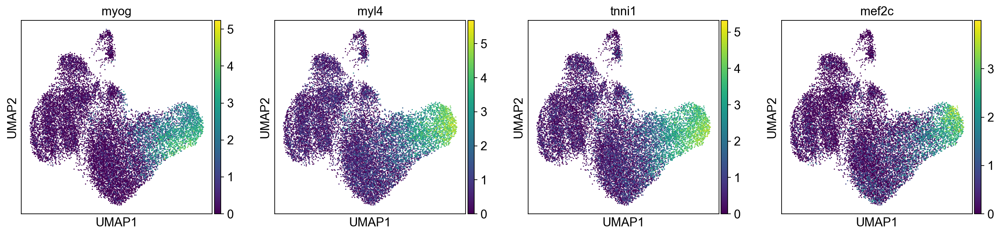

In [15]:
sc.pl.umap(adata_proc, color=["myog", "myl4", "tnni1", "mef2c"], use_raw=False)

did not find: []


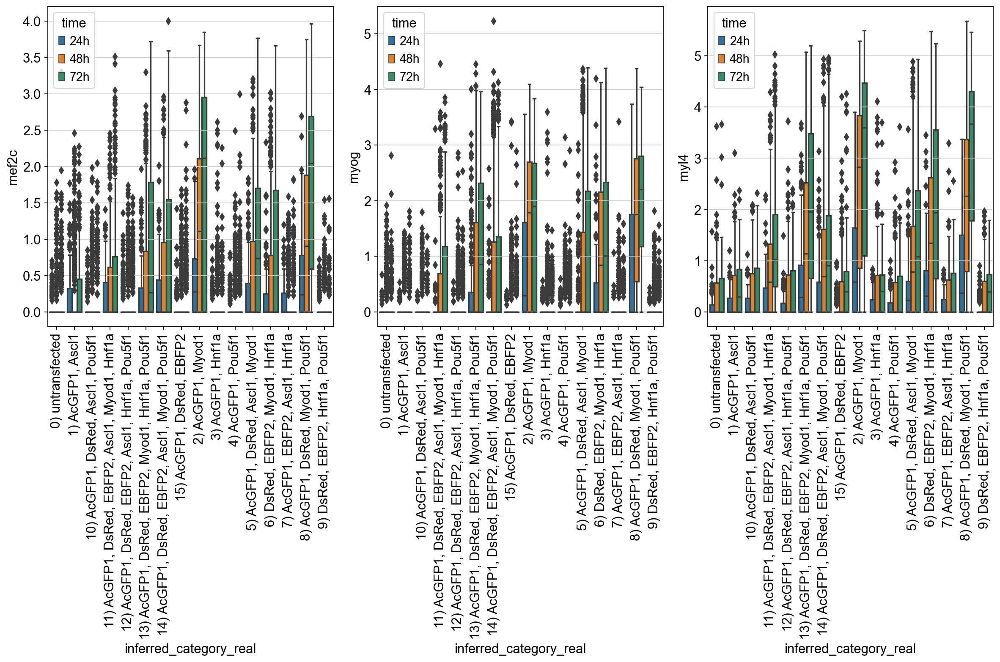

did not find: []


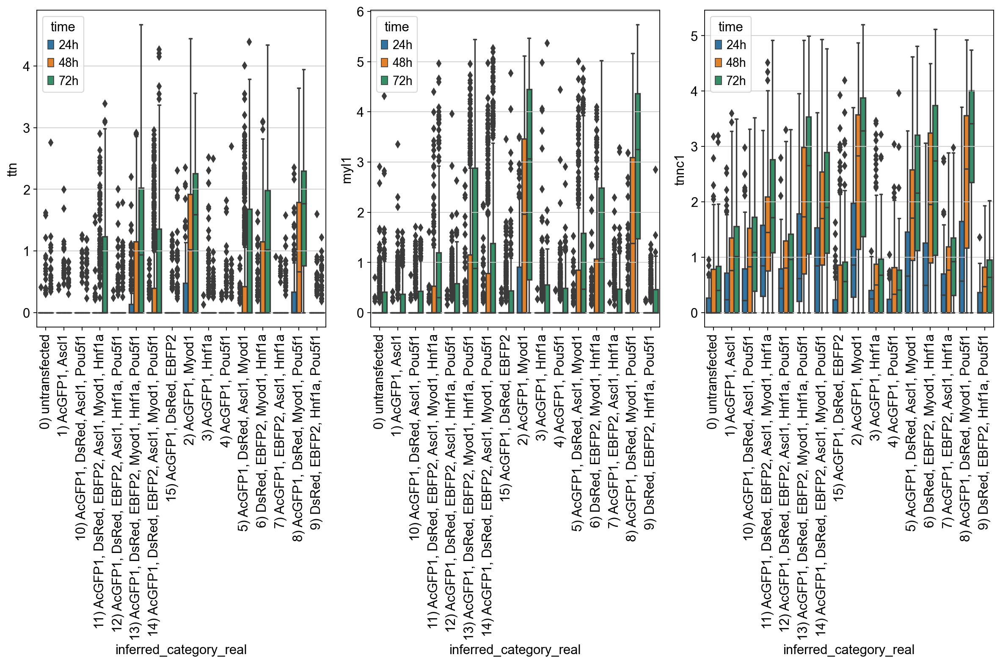

did not find: []


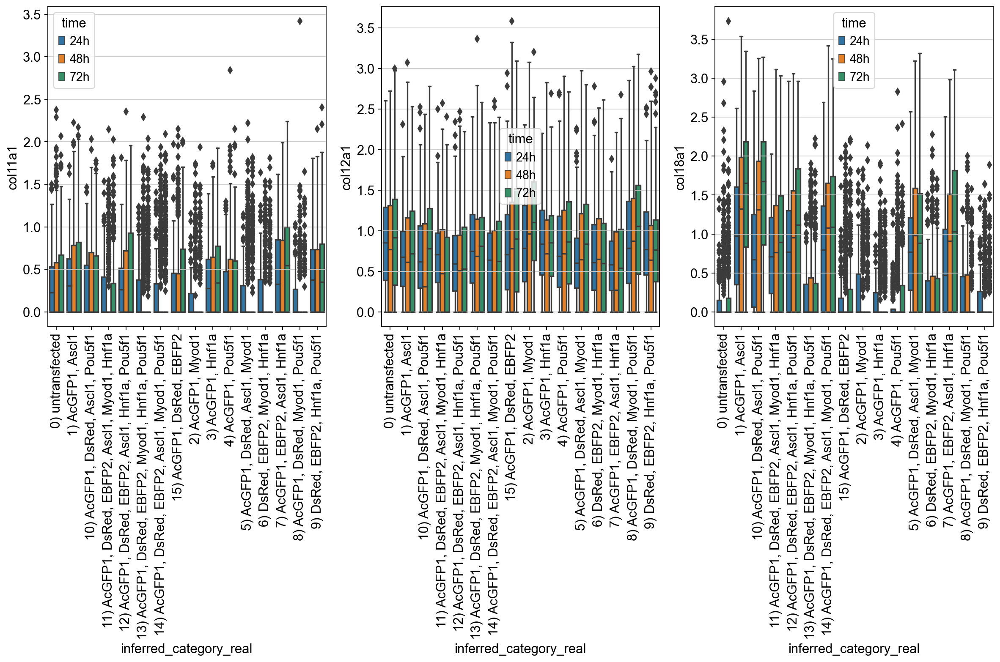

In [16]:
boxplot_cluster_hue(adata=adata_proc, x=["mef2c", "myog", "myl4"], hue="time", clustercol="inferred_category_real", row_height=10)
boxplot_cluster_hue(adata=adata_proc, x=["ttn", "myl1", "tnnc1"], hue="time", clustercol="inferred_category_real", row_height=10)
boxplot_cluster_hue(adata=adata_proc, x=["col11a1", "col12a1", "col18a1"], hue="time", clustercol="inferred_category_real", row_height=10)

did not find: []


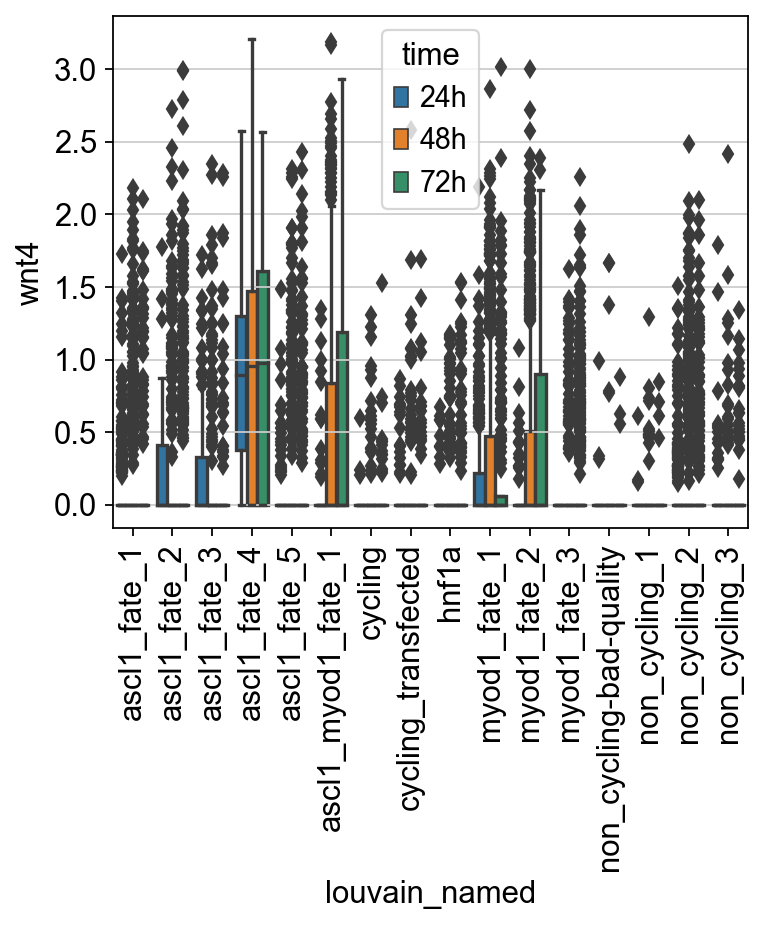

did not find: []


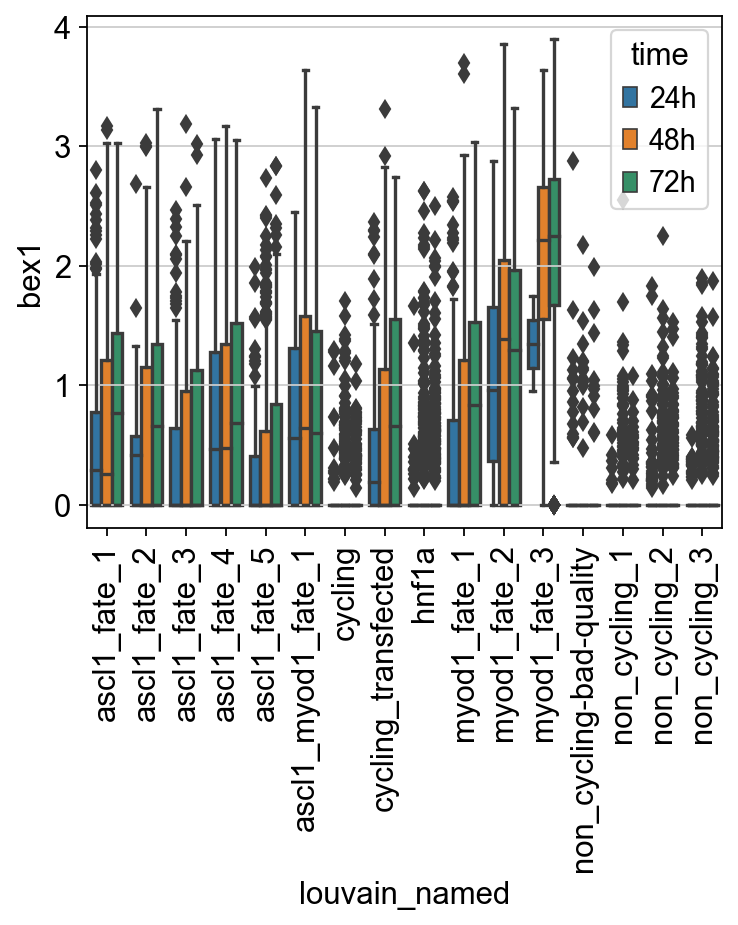

did not find: []


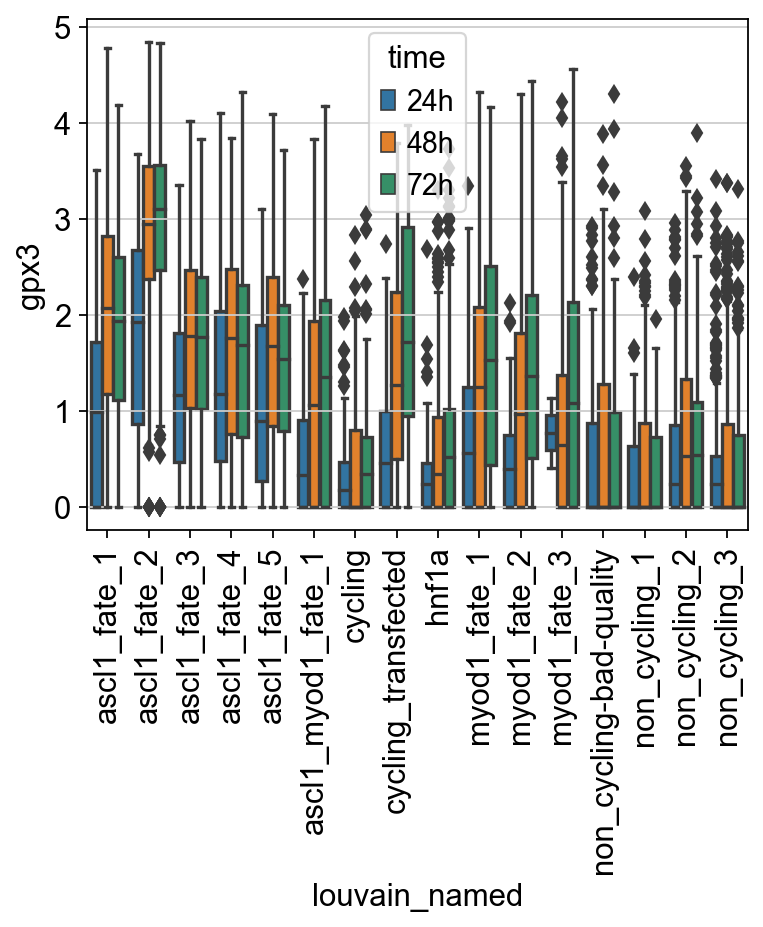

In [17]:
boxplot_cluster_hue(adata=adata_proc, x="wnt4", hue="time", clustercol="louvain_named")
boxplot_cluster_hue(adata=adata_proc, x="bex1", hue="time", clustercol="louvain_named")
boxplot_cluster_hue(adata=adata_proc, x="gpx3", hue="time", clustercol="louvain_named")

## bHLH related

### E-box binding

did not find: ['ascl2', 'c1orf51', 'lmo2', 'myf5', 'myf6', 'myod1', 'neurod1', 'neurod2', 'neurog1', 'neurog2', 'ptf1a', 'scxb', 'tal1', 'tcf21']


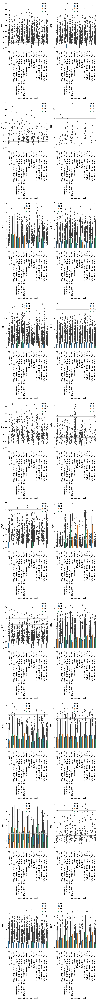

In [18]:
boxplot_cluster_hue(
    adata=adata_proc, x=ebox_binding_genes,
    hue="time", clustercol="inferred_category_real", clusters=None,
    row_height=10, ncols=2
)

did not find: ['ascl2', 'c1orf51', 'lmo2', 'myf5', 'myf6', 'myod1', 'neurod1', 'neurod2', 'neurog1', 'neurog2', 'ptf1a', 'scxb', 'tal1', 'tcf21']


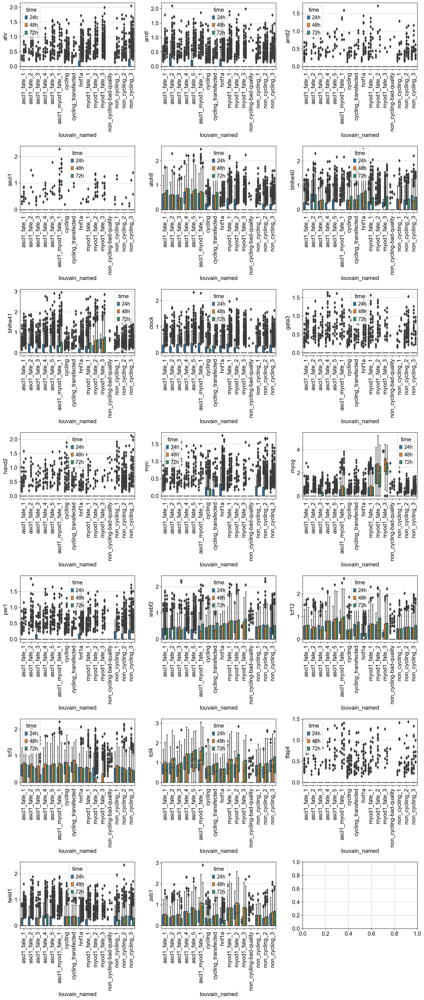

In [19]:
boxplot_cluster_hue(
    adata=adata_proc, x=ebox_binding_genes,
    hue="time", clustercol="louvain_named", clusters=None,
    row_height=5, ncols=3
)

### bHLH

did not find: ['foxh1', 'hand1', 'isl1', 'lmo2', 'scxb', 'tcf21']


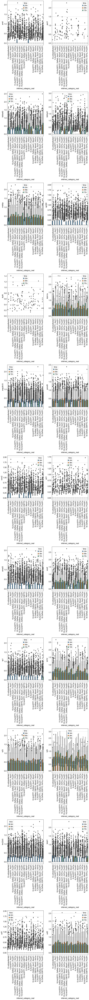

In [20]:
boxplot_cluster_hue(
    adata=adata_proc, x=bhlh_genes,
    hue="time", clustercol="inferred_category_real", clusters=None,
    row_height=10, ncols=2
)

did not find: ['foxh1', 'hand1', 'isl1', 'lmo2', 'scxb', 'tcf21']


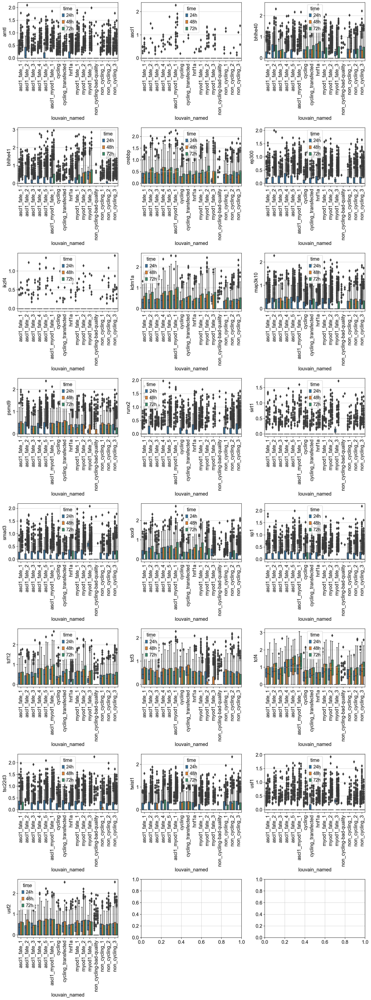

In [21]:
boxplot_cluster_hue(
    adata=adata_proc, x=bhlh_genes,
    hue="time", clustercol="louvain_named", clusters=None,
    row_height=5, ncols=3
)

### Id proteins

did not find: []


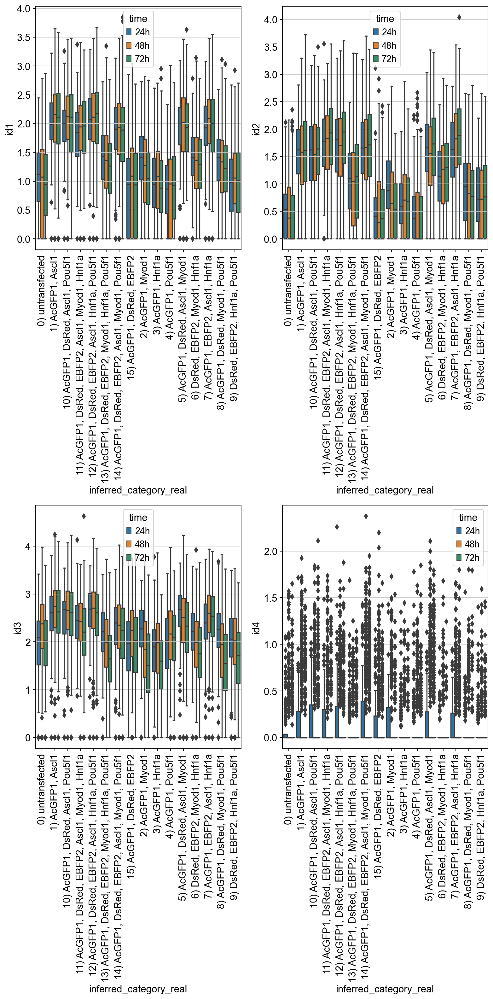

In [22]:
boxplot_cluster_hue(
    adata=adata_proc, x=["id1", "id2", "id3", "id4"],
    hue="time", clustercol="inferred_category_real", clusters=None,
    row_height=10, ncols=2
)

did not find: []


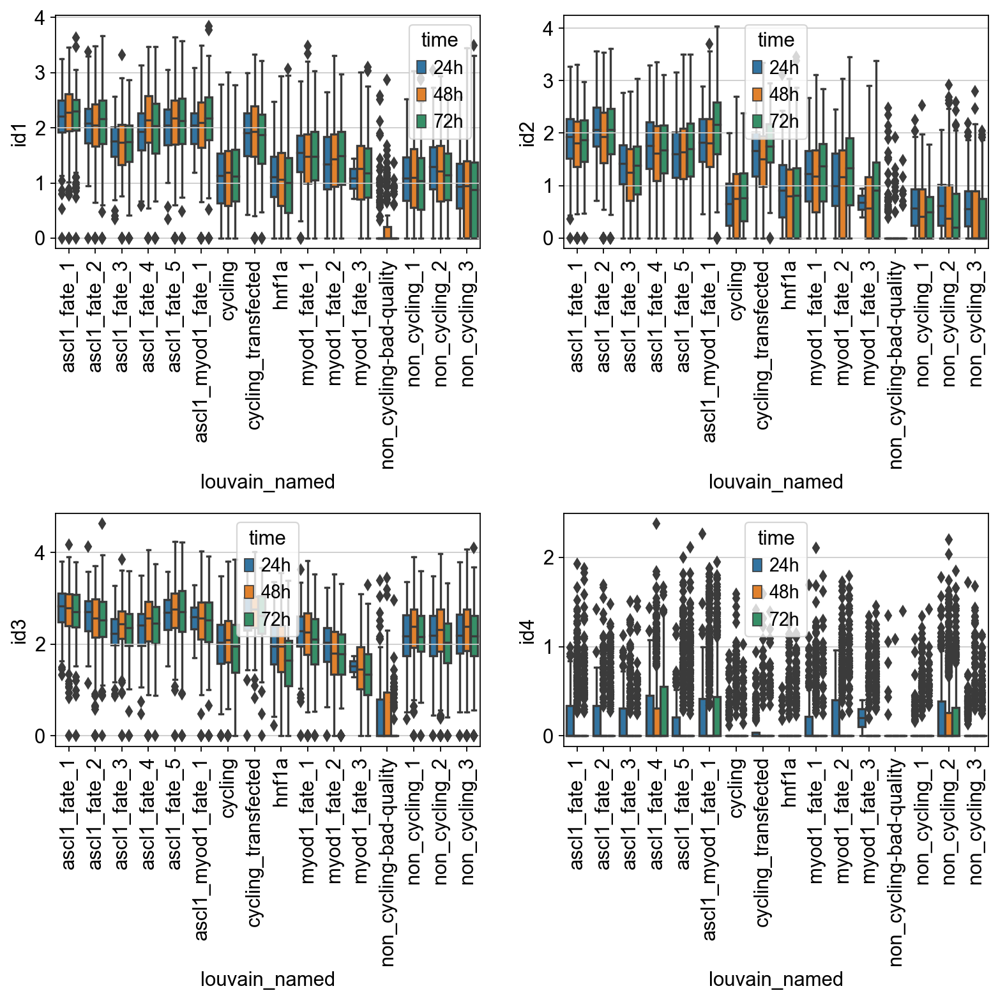

In [23]:
boxplot_cluster_hue(
    adata=adata_proc, x=["id1", "id2", "id3", "id4"],
    hue="time", clustercol="louvain_named", clusters=None,
    row_height=5, ncols=2
)

# Attenuation of Ascl1 / Myod1 lineages by others

## Cluster-based

Hnf1a attenuates Ascl1 lineage: Biases Ascl1 lineage to intermediate states ascl1_fate_0,1. This does not happen on Myod1 lineage:

Pou5f1 does not influence state choice in Ascl1 and Myod1 lineage:

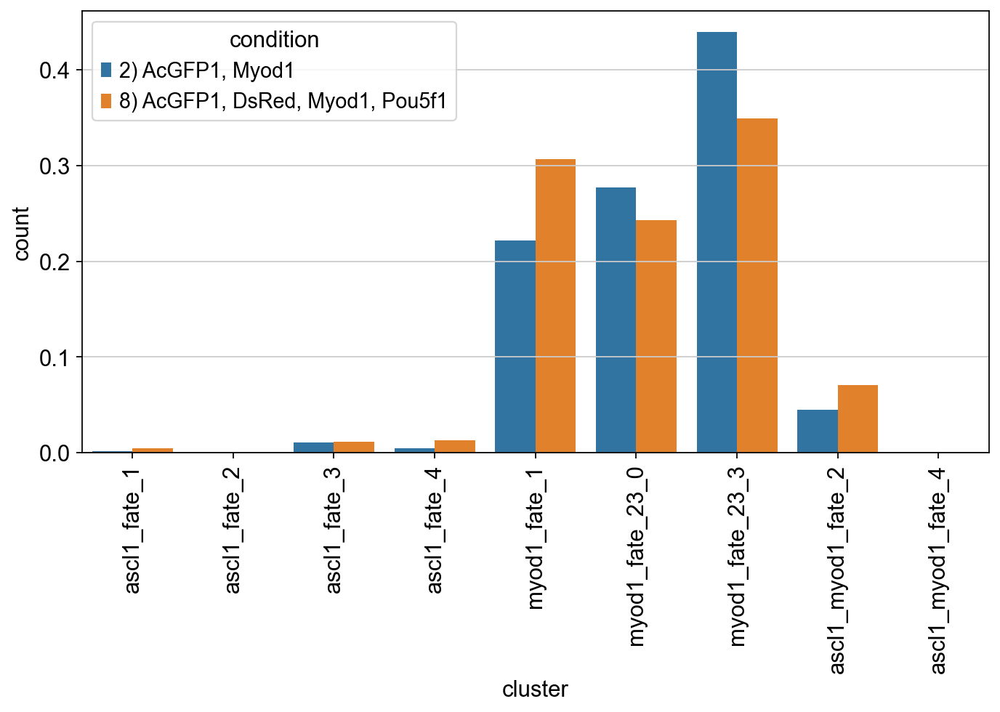

In [24]:
target_clusters = [
    'ascl1_fate_1',
    'ascl1_fate_2',
    'ascl1_fate_3',
    'ascl1_fate_4',
    'myod1_fate_1',
    'myod1_fate_23_0',
    'myod1_fate_23_3',
    "ascl1_myod1_fate_2", 
    "ascl1_myod1_fate_4",
]
obs_temp = adata_proc.obs.copy()
obs_temp["louvain_named_subclustered"] = [  # merge myod1_fate_23_0 and myod1_fate_23_1
    "myod1_fate_23_0" if x in ["myod1_fate_23_0", "myod1_fate_23_1"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp["louvain_named_subclustered"] = [  # merge ascl1_myod1_fate_2 and ascl1_myod1_fate_3
    "ascl1_myod1_fate_2" if x in ["ascl1_myod1_fate_2", "ascl1_myod1_fate_3"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp = obs_temp[[  # choose target clusters
    x in target_clusters
    for x in obs_temp["louvain_named_subclustered"].values
]]
obs_temp["louvain_named_subclustered"] = pd.Categorical(
    obs_temp["louvain_named_subclustered"].values,
    categories=target_clusters
)
obs_temp = obs_temp[[  # choose target conditions
    x in [
        '2) AcGFP1, Myod1',
        '8) AcGFP1, DsRed, Myod1, Pou5f1'
    ]
    for x in obs_temp["inferred_category_real"].values
]]
obs_temp["inferred_category_real"] = pd.Categorical(
    obs_temp["inferred_category_real"].values, 
    categories=[
        '2) AcGFP1, Myod1',
        '8) AcGFP1, DsRed, Myod1, Pou5f1'
    ]
)

counttable = (
    obs_temp.groupby(["inferred_category_real", "louvain_named_subclustered"]).size() / 
    obs_temp.groupby(["inferred_category_real"]).size()
).to_frame('count').reset_index()
counttable["condition"] = counttable["inferred_category_real"].values
counttable["cluster"] = counttable["louvain_named_subclustered"].values

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
sb.barplot(data=counttable, x="cluster", hue="condition", y="count", ax=axs)
axs.xaxis.set_tick_params(rotation=90)

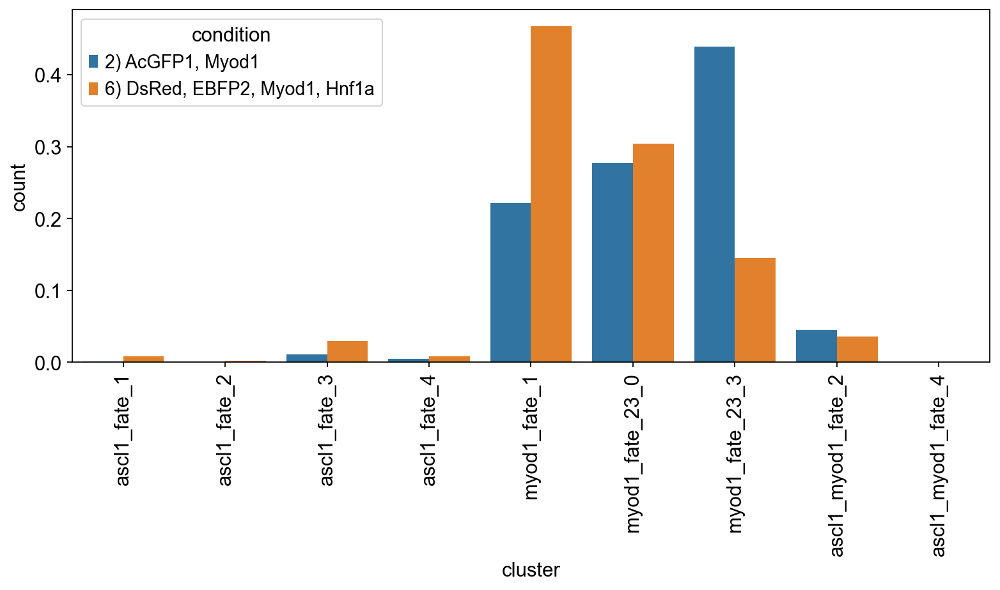

In [25]:
target_clusters = [
    'ascl1_fate_1',
    'ascl1_fate_2',
    'ascl1_fate_3',
    'ascl1_fate_4',
    'myod1_fate_1',
    'myod1_fate_23_0',
    'myod1_fate_23_3',
    "ascl1_myod1_fate_2", 
    "ascl1_myod1_fate_4",
]
obs_temp = adata_proc.obs.copy()
obs_temp["louvain_named_subclustered"] = [  # merge myod1_fate_23_0 and myod1_fate_23_1
    "myod1_fate_23_0" if x in ["myod1_fate_23_0", "myod1_fate_23_1"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp["louvain_named_subclustered"] = [  # merge ascl1_myod1_fate_2 and ascl1_myod1_fate_3
    "ascl1_myod1_fate_2" if x in ["ascl1_myod1_fate_2", "ascl1_myod1_fate_3"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp = obs_temp[[  # choose target clusters
    x in target_clusters
    for x in obs_temp["louvain_named_subclustered"].values
]]
obs_temp["louvain_named_subclustered"] = pd.Categorical(
    obs_temp["louvain_named_subclustered"].values,
    categories=target_clusters
)
obs_temp = obs_temp[[  # choose target conditions
    x in [
        '2) AcGFP1, Myod1',
        '6) DsRed, EBFP2, Myod1, Hnf1a',
    ]
    for x in obs_temp["inferred_category_real"].values
]]
obs_temp["inferred_category_real"] = pd.Categorical(
    obs_temp["inferred_category_real"].values, 
    categories=[
        '2) AcGFP1, Myod1',
        '6) DsRed, EBFP2, Myod1, Hnf1a',
    ]
)

counttable = (
    obs_temp.groupby(["inferred_category_real", "louvain_named_subclustered"]).size() / 
    obs_temp.groupby(["inferred_category_real"]).size()
).to_frame('count').reset_index()
counttable["condition"] = counttable["inferred_category_real"].values
counttable["cluster"] = counttable["louvain_named_subclustered"].values

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
sb.barplot(data=counttable, x="cluster", hue="condition", y="count", ax=axs)
axs.xaxis.set_tick_params(rotation=90)
axs.grid(False)
plt.tight_layout()
plt.show()

Ascl1 pushes Myod1 positive cells to myod1_fate_2, the double positive state:

Myod1 seems to push Aslc1 positive cells to the more mature states ascl2_fate2,3:

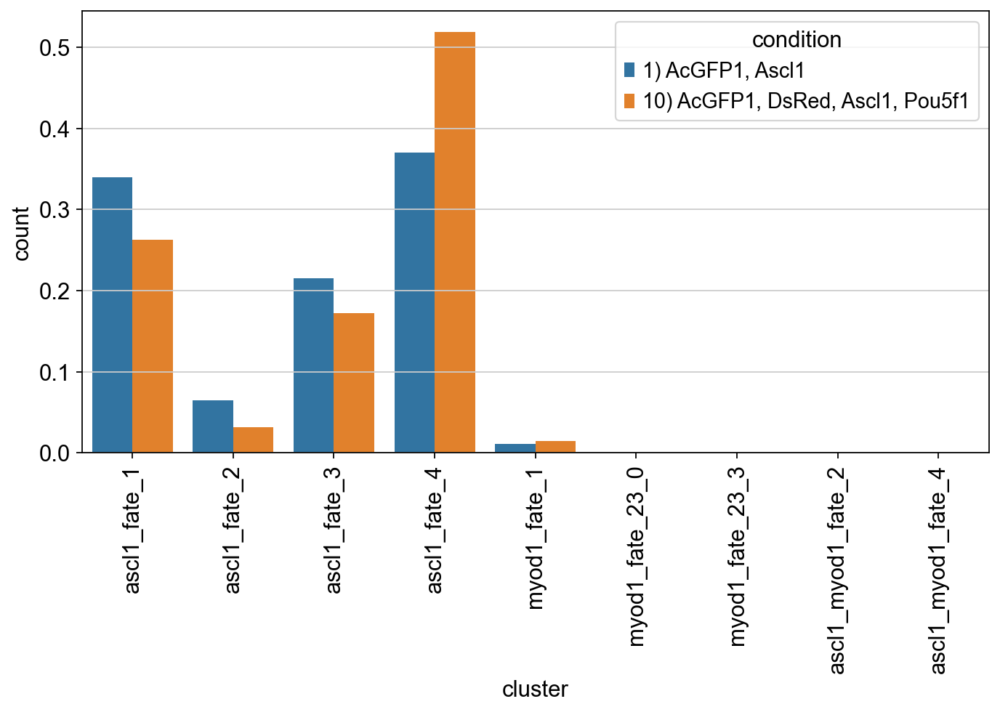

In [26]:
target_clusters = [
    'ascl1_fate_1',
    'ascl1_fate_2',
    'ascl1_fate_3',
    'ascl1_fate_4',
    'myod1_fate_1',
    'myod1_fate_23_0',
    'myod1_fate_23_3', 
    "ascl1_myod1_fate_2", 
    "ascl1_myod1_fate_4",
]
obs_temp = adata_proc.obs.copy()
obs_temp["louvain_named_subclustered"] = [  # merge myod1_fate_23_0 and myod1_fate_23_1
    "myod1_fate_23_0" if x in ["myod1_fate_23_0", "myod1_fate_23_1"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp["louvain_named_subclustered"] = [  # merge ascl1_myod1_fate_2 and ascl1_myod1_fate_3
    "ascl1_myod1_fate_2" if x in ["ascl1_myod1_fate_2", "ascl1_myod1_fate_3"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp = obs_temp[[  # choose target clusters
    x in target_clusters
    for x in obs_temp["louvain_named_subclustered"].values
]]
obs_temp["louvain_named_subclustered"] = pd.Categorical(
    obs_temp["louvain_named_subclustered"].values,
    categories=target_clusters
)
obs_temp = obs_temp[[  # choose target conditions
    x in [
        '1) AcGFP1, Ascl1',
        '10) AcGFP1, DsRed, Ascl1, Pou5f1',
    ]
    for x in obs_temp["inferred_category_real"].values
]]
obs_temp["inferred_category_real"] = pd.Categorical(
    obs_temp["inferred_category_real"].values, 
    categories=[
        '1) AcGFP1, Ascl1',
        '10) AcGFP1, DsRed, Ascl1, Pou5f1',
    ]
)

counttable = (
    obs_temp.groupby(["inferred_category_real", "louvain_named_subclustered"]).size() / 
    obs_temp.groupby(["inferred_category_real"]).size()
).to_frame('count').reset_index()
counttable["condition"] = counttable["inferred_category_real"].values
counttable["cluster"] = counttable["louvain_named_subclustered"].values

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
sb.barplot(data=counttable, x="cluster", hue="condition", y="count", ax=axs)
axs.xaxis.set_tick_params(rotation=90)

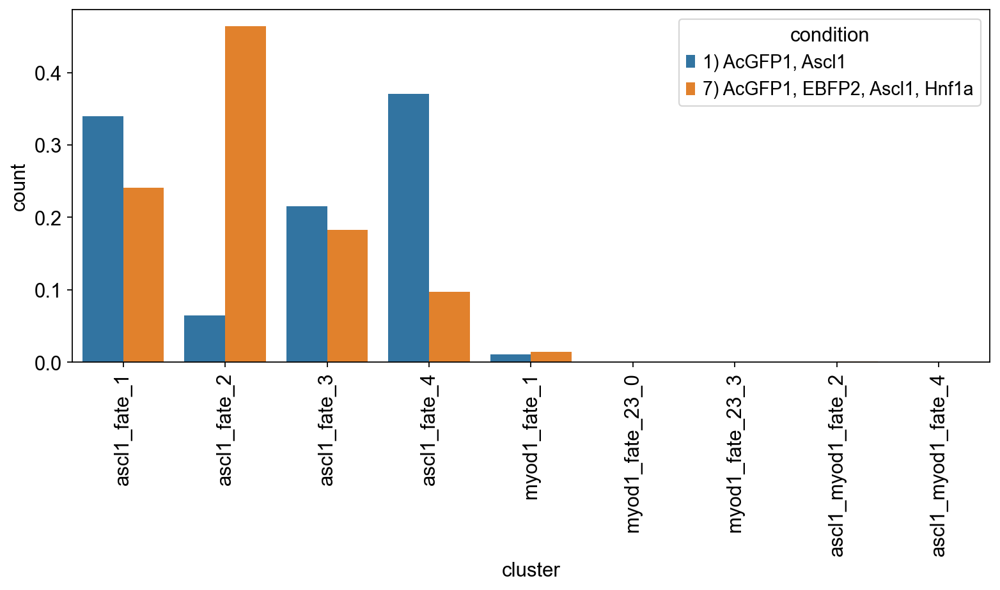

In [27]:
target_clusters = [
    'ascl1_fate_1',
    'ascl1_fate_2',
    'ascl1_fate_3',
    'ascl1_fate_4',
    'myod1_fate_1',
    'myod1_fate_23_0',
    'myod1_fate_23_3',
    "ascl1_myod1_fate_2", 
    "ascl1_myod1_fate_4",
]
obs_temp = adata_proc.obs.copy()
obs_temp["louvain_named_subclustered"] = [  # merge myod1_fate_23_0 and myod1_fate_23_1
    "myod1_fate_23_0" if x in ["myod1_fate_23_0", "myod1_fate_23_1"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp["louvain_named_subclustered"] = [  # merge ascl1_myod1_fate_2 and ascl1_myod1_fate_3
    "ascl1_myod1_fate_2" if x in ["ascl1_myod1_fate_2", "ascl1_myod1_fate_3"]
    else x for x in obs_temp["louvain_named_subclustered"].values
]
obs_temp = obs_temp[[  # choose target clusters
    x in target_clusters
    for x in obs_temp["louvain_named_subclustered"].values
]]
obs_temp["louvain_named_subclustered"] = pd.Categorical(
    obs_temp["louvain_named_subclustered"].values,
    categories=target_clusters
)
obs_temp = obs_temp[[  # choose target conditions
    x in [
        '1) AcGFP1, Ascl1',
        '7) AcGFP1, EBFP2, Ascl1, Hnf1a',
    ]
    for x in obs_temp["inferred_category_real"].values
]]
obs_temp["inferred_category_real"] = pd.Categorical(
    obs_temp["inferred_category_real"].values, 
    categories=[
        '1) AcGFP1, Ascl1',
        '7) AcGFP1, EBFP2, Ascl1, Hnf1a',
    ]
)

counttable = (
    obs_temp.groupby(["inferred_category_real", "louvain_named_subclustered"]).size() / 
    obs_temp.groupby(["inferred_category_real"]).size()
).to_frame('count').reset_index()
counttable["condition"] = counttable["inferred_category_real"].values
counttable["cluster"] = counttable["louvain_named_subclustered"].values

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
sb.barplot(data=counttable, x="cluster", hue="condition", y="count", ax=axs)
axs.xaxis.set_tick_params(rotation=90)
axs.grid(False)
plt.tight_layout()
plt.show()

## Fate score based

### Compute neurogenic score

In [28]:
with open(dir_anndata + "adata_filtered_velo_bycond.pickle", "rb") as f:
    adata_filtered_velo_bycond = pickle.load(file=f)

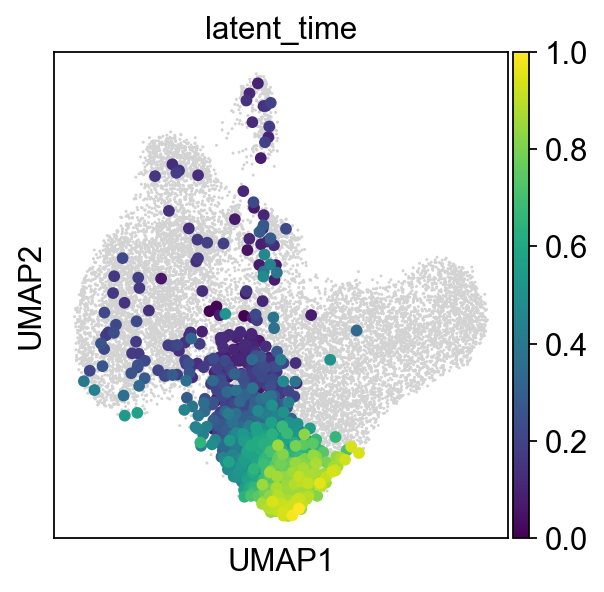

In [29]:
fig, axs = plt.subplots(1,1)
axs = sc.pl.umap(
    adata=adata_proc,
    ax=axs,
    show=False
)
axs = sc.pl.umap(
    adata=adata_filtered_velo_bycond['1) AcGFP1, Ascl1'],
    color="latent_time",
    ax=axs,
    show=False
)
plt.show()

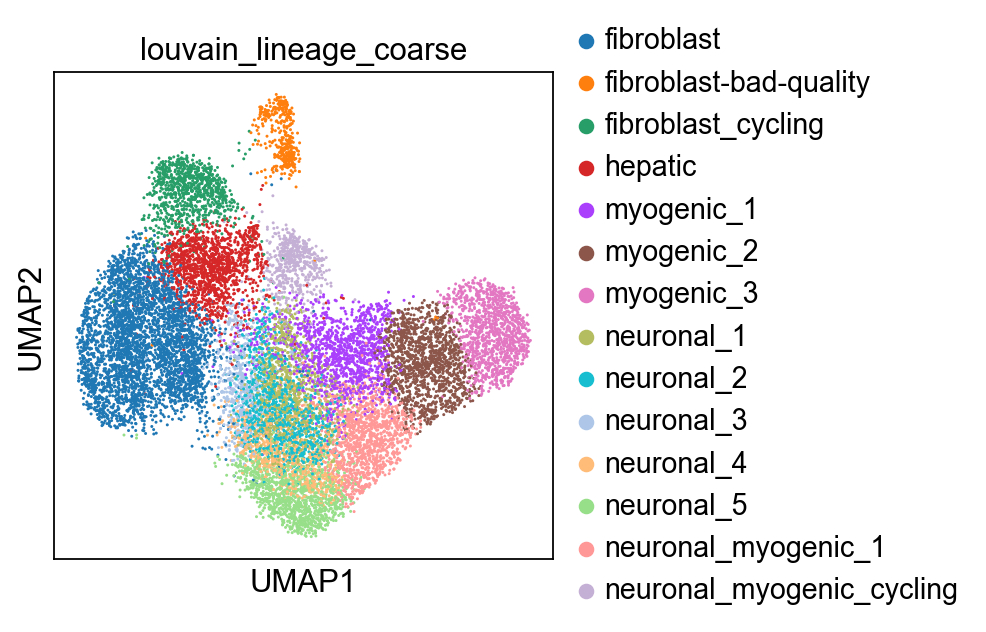

In [30]:
sc.pl.umap(adata_proc, color="louvain_lineage_coarse")

In [31]:
adata_temp = adata_proc[
    [
        x in [
            'neuronal_1', 
            'neuronal_2',
            'neuronal_3', 
            'neuronal_4', 
            'neuronal_5',
            'neuronal_myogenic_1',
            'myogenic_1',
            'myogenic_2',
            'myogenic_3',
        ]
        for x in adata_proc.obs["louvain_lineage_coarse"].values
    ]
].copy()
adata_proc.obs["dpt_pseudotime_ascl1"] = np.nan
adata_proc.obs["latent_time_ascl1"] = np.nan
rootidx = adata_temp.obs_names.tolist().index(
    adata_filtered_velo_bycond['1) AcGFP1, Ascl1'].obs_names[np.argmax(adata_filtered_velo_bycond['1) AcGFP1, Ascl1'].obs["latent_time"].values)]
)
adata_temp.uns['iroot'] = rootidx
sc.pp.pca(adata_temp)
sc.pp.neighbors(adata_temp)
sc.tl.dpt(adata_temp)
adata_proc.obs.loc[adata_temp.obs_names, "dpt_pseudotime_ascl1"] = adata_temp.obs["dpt_pseudotime"].values
adata_proc.obs["fate_score_ascl1"] = 1. - adata_proc.obs["dpt_pseudotime_ascl1"].values
adata_proc.obs.loc[adata_filtered_velo_bycond['1) AcGFP1, Ascl1'].obs_names, "latent_time_ascl1"] = adata_filtered_velo_bycond['1) AcGFP1, Ascl1'].obs["latent_time"]
del adata_temp

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9865785  0.9481148  0.9337163  0.920517   0.91702414
     0.9102115  0.90248245 0.89973384 0.88925636 0.8858901  0.87755096
     0.8714873  0.8701716  0.8653949 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


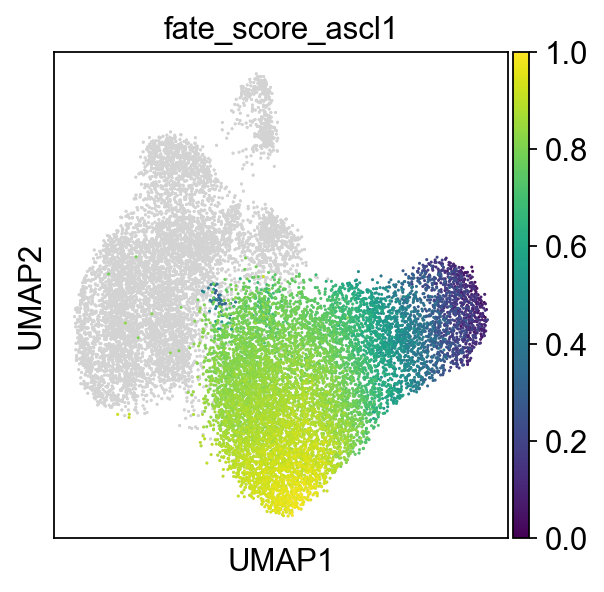

In [32]:
fig, axs = plt.subplots(1,1)
axs = sc.pl.umap(
    adata=adata_proc,
    show=False,
    ax=axs
)
axs = sc.pl.umap(
    adata=adata_proc,
    color="fate_score_ascl1",
    show=False,
    ax=axs
)

<AxesSubplot:xlabel='fate_score_ascl1', ylabel='latent_time_ascl1'>

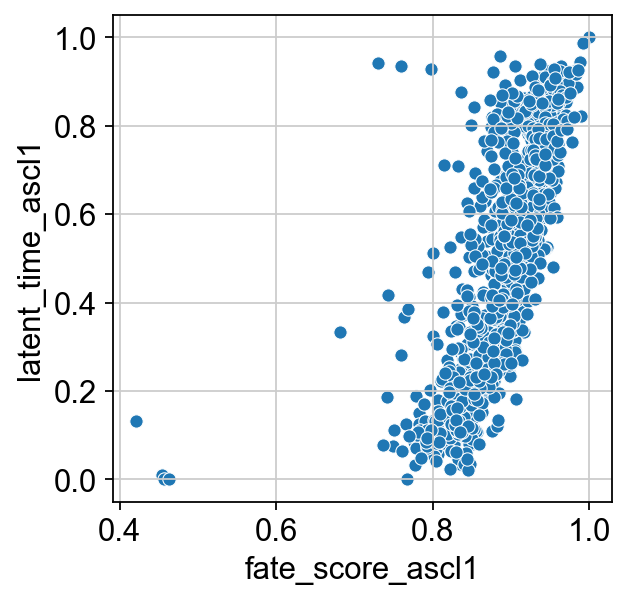

In [33]:
sb.scatterplot(
    x=adata_proc.obs["fate_score_ascl1"],
    y=adata_proc.obs["latent_time_ascl1"]
)

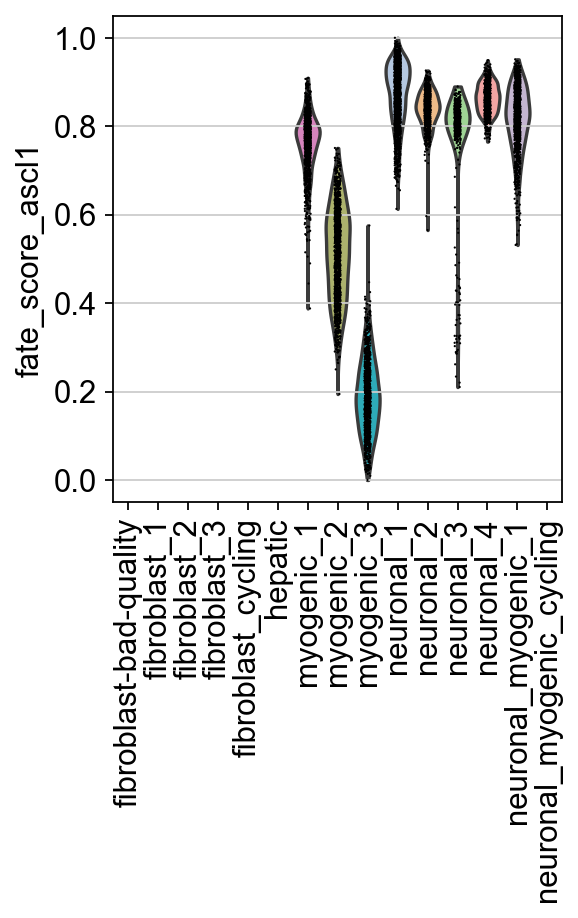

In [34]:
sc.pl.violin(
    adata_proc,
    keys="fate_score_ascl1",
    groupby="louvain_lineage",
    rotation=90
)

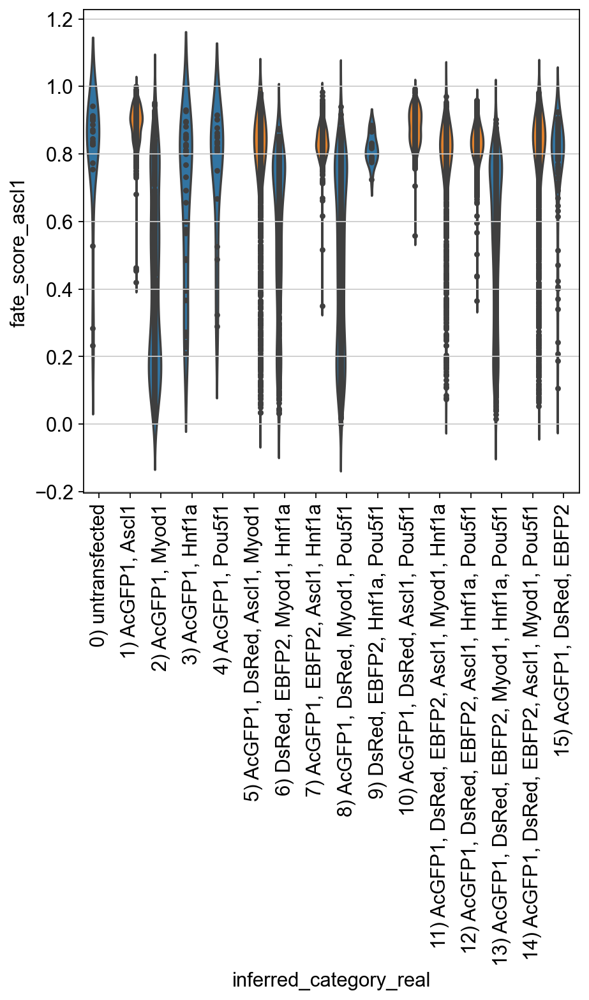

In [35]:
fig, axs = plt.subplots(1,1, figsize=(6,10))
axs = sb.violinplot(
    data=adata_proc.obs,
    y="fate_score_ascl1",
    x="inferred_category_real",
    hue="Ascl1_transgene_positive_condition",
    inner="point",
    ax=axs
)
axs.xaxis.set_tick_params(rotation=90)
axs.get_legend().remove()
plt.tight_layout()

### Compute myogenic score

#### Using myogenic cluster as endpoint (up to myogenic_2)

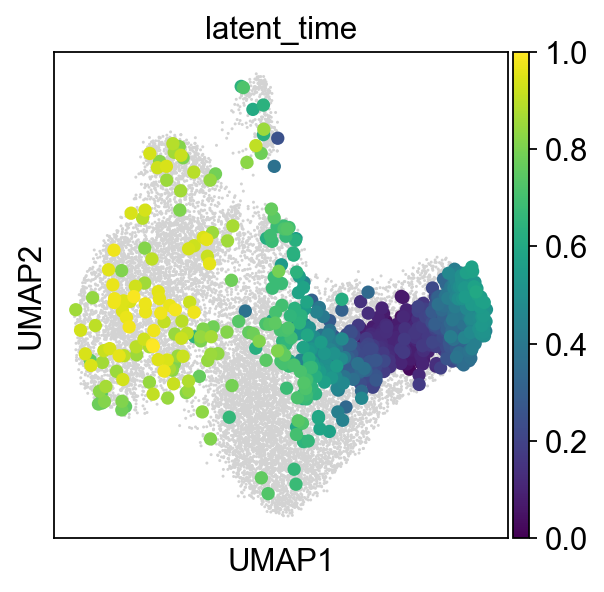

In [36]:
fig, axs = plt.subplots(1,1)
axs = sc.pl.umap(
    adata=adata_proc,
    ax=axs,
    show=False
)
axs = sc.pl.umap(
    adata=adata_filtered_velo_bycond['2) AcGFP1, Myod1'],
    color="latent_time",
    ax=axs,
    show=False
)
plt.show()

In [37]:
adata_temp = adata_proc[
    [
        x in [
            'neuronal_1', 
            'neuronal_2',
            'neuronal_3', 
            'neuronal_4', 
            'neuronal_5',
            'neuronal_myogenic_1',
            'neuronal_myogenic_2',
            'myogenic_1',
            'myogenic_23_0',
            'myogenic_23_1',
            'myogenic_23_2',
            'myogenic_23_3',
        ]
        for x in adata_proc.obs["louvain_lineage_subclustered"].values
    ]
].copy()
adata_proc.obs["dpt_pseudotime_myod1_premature"] = np.nan
adata_proc.obs["latent_time_myod1_premature"] = np.nan
adata_temp = adata_temp[[
    x not in ["myogenic_23_2", "myogenic_23_3"]
    for x in adata_temp.obs["louvain_lineage_subclustered"].values
]].copy()
adata_filtered_velo_bycond_subset = adata_filtered_velo_bycond['2) AcGFP1, Myod1'][[
    x in adata_temp.obs_names and
    adata_temp[x].obs["louvain_lineage_subclustered"].values[0] not in ["myogenic_23_0", "myogenic_23_1", "myogenic_23_2", "myogenic_23_3"] 
    for x in adata_filtered_velo_bycond['2) AcGFP1, Myod1'].obs_names]
].copy()
rootidx = adata_temp.obs_names.tolist().index(
    adata_filtered_velo_bycond_subset.obs_names[np.argmin(
        adata_filtered_velo_bycond_subset.obs["latent_time"].values
    )]
)
adata_temp.uns['iroot'] = rootidx
sc.pp.pca(adata_temp)
sc.pp.neighbors(adata_temp)
sc.tl.dpt(adata_temp)
adata_proc.obs.loc[adata_temp.obs_names, "dpt_pseudotime_myod1_premature"] = adata_temp.obs["dpt_pseudotime"].values
adata_proc.obs["fate_score_myod1_premature"] = 1. - adata_proc.obs["dpt_pseudotime_myod1_premature"].values
adata_proc.obs.loc[adata_filtered_velo_bycond['2) AcGFP1, Myod1'].obs_names, "latent_time_myod1_premature"] = adata_filtered_velo_bycond['2) AcGFP1, Myod1'].obs["latent_time"]
del adata_temp

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.97228616 0.9351539  0.92365026 0.9184754  0.9133552
     0.9055549  0.89872164 0.8902094  0.8790463  0.8756202  0.8719747
     0.8694604  0.86253166 0.8605995 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


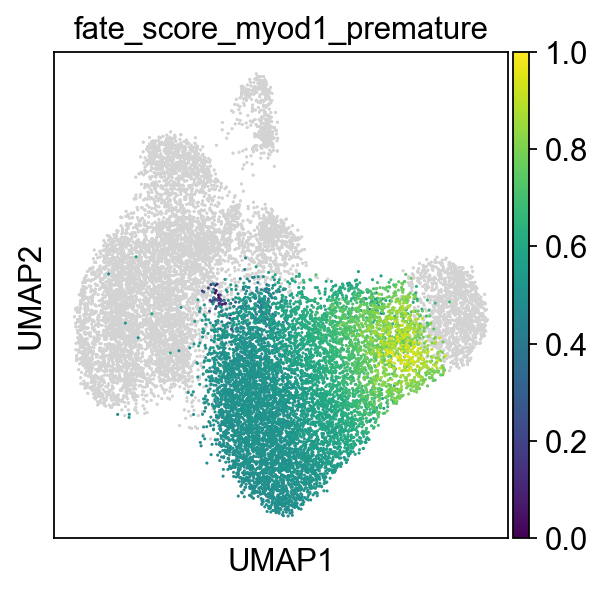

In [38]:
fig, axs = plt.subplots(1,1)
axs = sc.pl.umap(
    adata=adata_proc,
    show=False,
    ax=axs
)
axs = sc.pl.umap(
    adata=adata_proc,
    color="fate_score_myod1_premature",
    show=False,
    ax=axs
)
plt.show()

<AxesSubplot:xlabel='fate_score_myod1_premature', ylabel='latent_time_myod1_premature'>

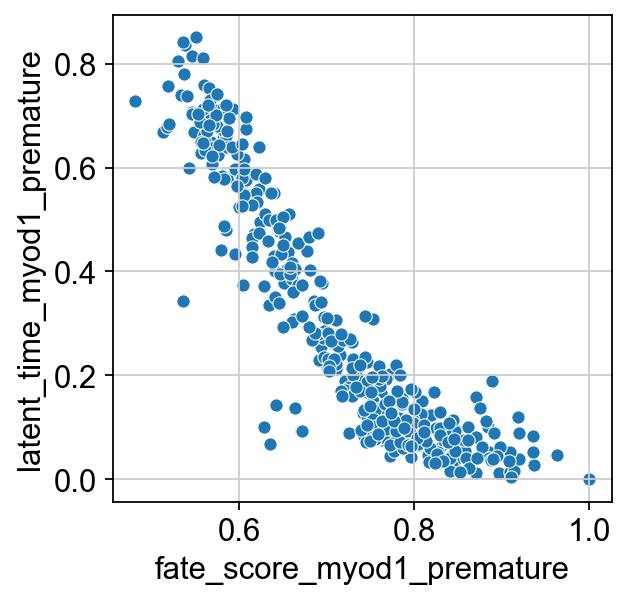

In [39]:
sb.scatterplot(
    x=adata_proc.obs["fate_score_myod1_premature"],
    y=adata_proc.obs["latent_time_myod1_premature"]
)

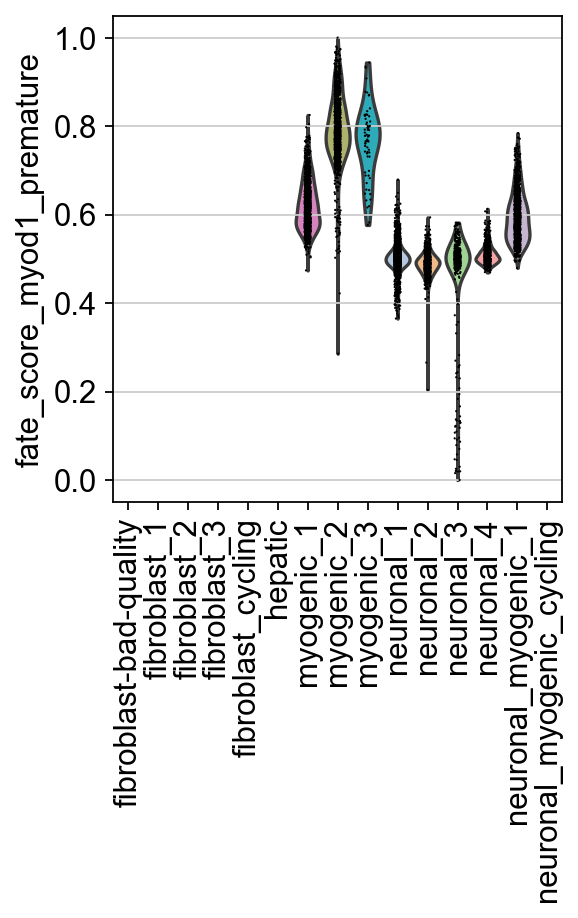

In [40]:
sc.pl.violin(
    adata_proc,
    keys="fate_score_myod1_premature",
    groupby="louvain_lineage",
    rotation=90
)

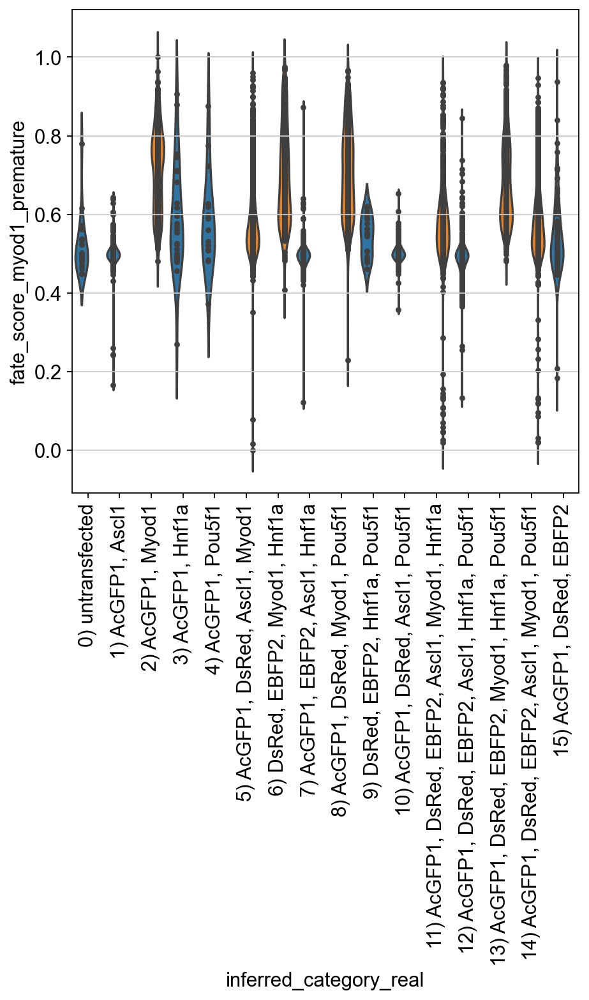

In [41]:
fig, axs = plt.subplots(1,1, figsize=(6,10))
axs = sb.violinplot(
    data=adata_proc.obs,
    y="fate_score_myod1_premature",
    x="inferred_category_real",
    hue="Myod1_transgene_positive_condition",
    inner="point",
    ax=axs
)
axs.xaxis.set_tick_params(rotation=90)
axs.get_legend().remove()
plt.tight_layout()

#### Using 72h cluster

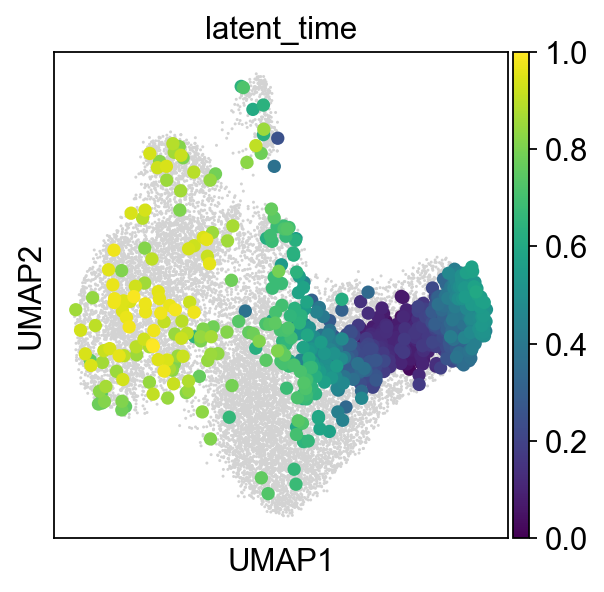

In [42]:
fig, axs = plt.subplots(1,1)
axs = sc.pl.umap(
    adata=adata_proc,
    ax=axs,
    show=False
)
axs = sc.pl.umap(
    adata=adata_filtered_velo_bycond['2) AcGFP1, Myod1'],
    color="latent_time",
    ax=axs,
    show=False
)
plt.show()

In [43]:
adata_proc.obs.groupby("louvain_lineage_coarse").size().reset_index()

,louvain_lineage_coarse,0
0,fibroblast,3793
1,fibroblast-bad-quality,396
2,fibroblast_cycling,925
3,hepatic,1443
4,myogenic_1,1352
5,myogenic_2,1336
6,myogenic_3,1111
7,neuronal_1,1051
8,neuronal_2,889
9,neuronal_3,578


In [44]:
adata_temp = adata_proc[
    [
        x in [
            'neuronal_1', 
            'neuronal_2',
            'neuronal_3', 
            'neuronal_4', 
            'neuronal_5',
            'neuronal_myogenic_1',
            'myogenic_1',
            'myogenic_2',
            'myogenic_3',
        ]
        for x in adata_proc.obs["louvain_lineage_coarse"].values
    ]
].copy()
adata_proc.obs["dpt_pseudotime_myod1"] = np.nan
adata_proc.obs["latent_time_myod1"] = np.nan
adata_filtered_velo_bycond_subset = adata_filtered_velo_bycond['2) AcGFP1, Myod1'][
    adata_filtered_velo_bycond['2) AcGFP1, Myod1'].obs["louvain_lineage_coarse"].values == "myogenic_3"
]
rootidx = adata_temp.obs_names.tolist().index(
    adata_filtered_velo_bycond_subset.obs_names[np.argmax(
        adata_filtered_velo_bycond_subset.obs["latent_time"].values
    )]
)
adata_temp.uns['iroot'] = rootidx
sc.pp.pca(adata_temp)
sc.pp.neighbors(adata_temp)
sc.tl.dpt(adata_temp)
adata_proc.obs.loc[adata_temp.obs_names, "dpt_pseudotime_myod1"] = adata_temp.obs["dpt_pseudotime"].values
adata_proc.obs["fate_score_myod1"] = 1. - adata_proc.obs["dpt_pseudotime_myod1"].values
adata_proc.obs.loc[adata_filtered_velo_bycond['2) AcGFP1, Myod1'].obs_names, "latent_time_myod1"] = adata_filtered_velo_bycond['2) AcGFP1, Myod1'].obs["latent_time"]
del adata_temp

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9865785  0.9481148  0.9337163  0.920517   0.91702414
     0.9102115  0.90248245 0.89973384 0.88925636 0.8858901  0.87755096
     0.8714873  0.8701716  0.8653949 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


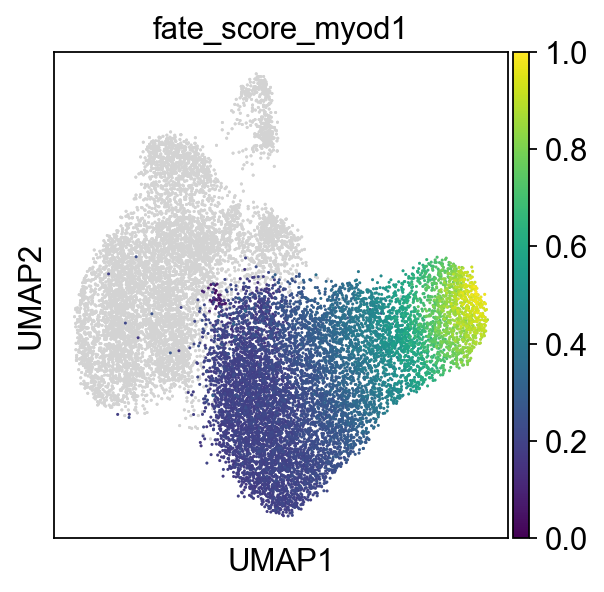

In [45]:
fig, axs = plt.subplots(1,1)
axs = sc.pl.umap(
    adata=adata_proc,
    show=False,
    ax=axs
)
axs = sc.pl.umap(
    adata=adata_proc,
    color="fate_score_myod1",
    show=False,
    ax=axs
)
plt.show()

<AxesSubplot:xlabel='fate_score_myod1', ylabel='latent_time_myod1'>

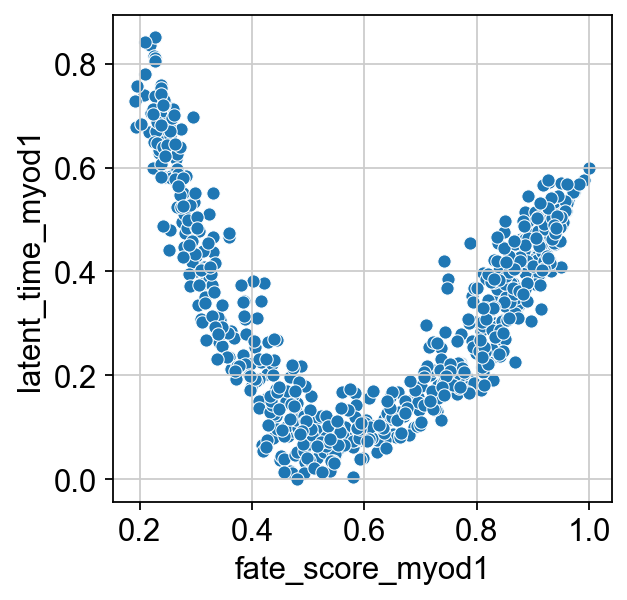

In [46]:
sb.scatterplot(
    x=adata_proc.obs["fate_score_myod1"],
    y=adata_proc.obs["latent_time_myod1"]
)

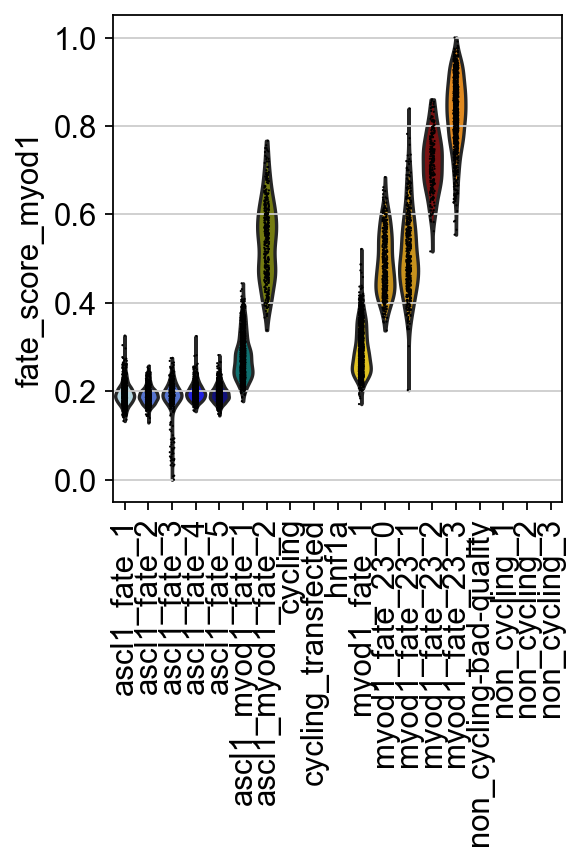

In [47]:
sc.pl.violin(
    adata_proc,
    keys="fate_score_myod1",
    groupby="louvain_named_subclustered",
    rotation=90
)

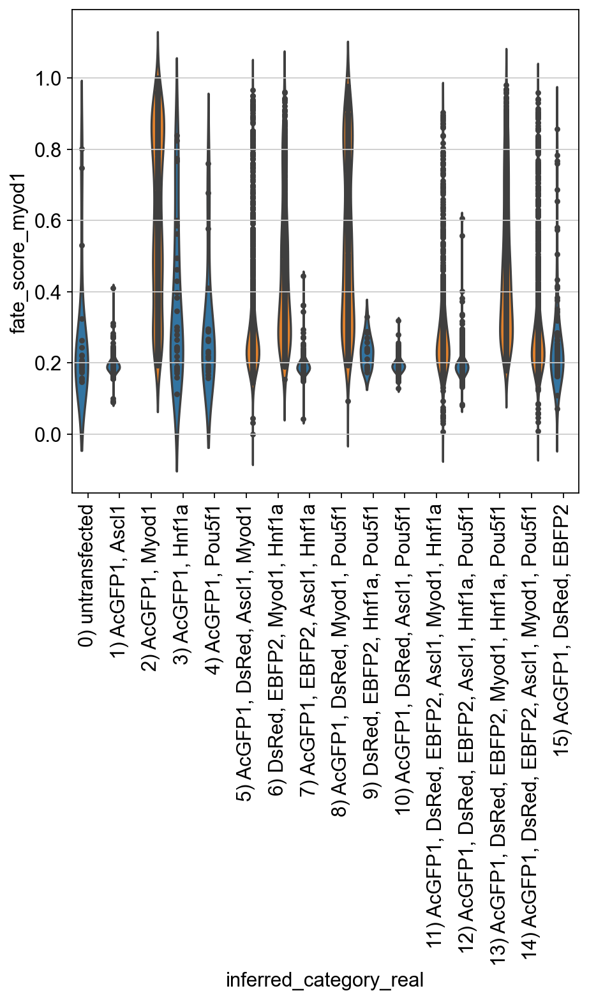

In [48]:
fig, axs = plt.subplots(1,1, figsize=(6,10))
axs = sb.violinplot(
    data=adata_proc.obs,
    y="fate_score_myod1",
    x="inferred_category_real",
    hue="Myod1_transgene_positive_condition",
    inner="point",
    ax=axs
)
axs.xaxis.set_tick_params(rotation=90)
axs.get_legend().remove()
plt.tight_layout()

### Compute attenuation

#### Neuronal lineage

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


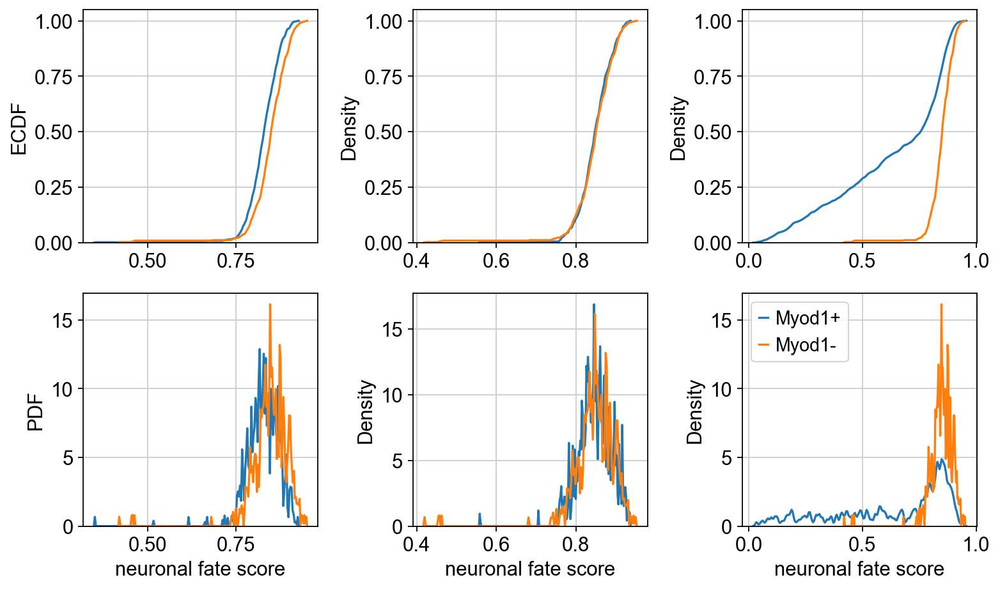

In [49]:
fig, axs = plt.subplots(ncols=3,nrows=2, figsize=(10,6))
for i, cond in enumerate([
    ("Hnf1a", '7) AcGFP1, EBFP2, Ascl1, Hnf1a'),
    ("Oct4", '10) AcGFP1, DsRed, Ascl1, Pou5f1'),
    ("Myod1", '5) AcGFP1, DsRed, Ascl1, Myod1')
]):
    cluster_selection = [
        'neuronal_1', 
        'neuronal_2',
        'neuronal_3', 
        'neuronal_4',
        'neuronal_myogenic',
        'myogenic_1',
        'myogenic_2',
        'myogenic_3',
    ]
    for j, cumul in enumerate([True, False]):
        axs[j,i] = sb.kdeplot(
            data=adata_proc[
                [
                    x in cluster_selection
                    and adata_proc.obs["inferred_category_real"].values[ii] == cond[1]
                    for ii, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
                ]
            ].obs["fate_score_ascl1"].values,
            label=cond[0]+"+",
            bw=0.02,
            cumulative=cumul,
            ax=axs[j,i]
        )
        axs[j,i] = sb.kdeplot(
            data=adata_proc[
                [
                    x in cluster_selection
                    and adata_proc.obs["inferred_category_real"].values[ii] == '1) AcGFP1, Ascl1'
                    for ii, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
                ]
            ].obs["fate_score_ascl1"].values,
            label=cond[0]+"-",
            bw=0.02,
            cumulative=cumul,
            ax=axs[j,i]
        )
        plt.legend()
        if i == 0:
            if j == 0:
                axs[j,i].set_ylabel("ECDF")
            if j == 1:
                axs[j,i].set_ylabel("PDF")
        if j == 1:
            axs[j,i].set_xlabel("neuronal fate score")
plt.tight_layout()
plt.show()

Myod1: p=0.000000
Hnf1a: p=0.000000
Oct4: p=0.157526


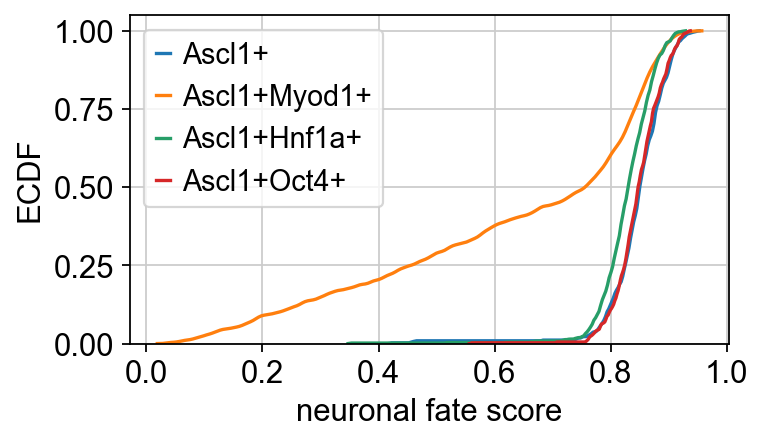

In [50]:
plt_pdf = False
if not plt_pdf:
    fig, axs = plt.subplots(ncols=1,nrows=1, figsize=(5,3))
    axs = [axs]
    cumuls = [True]
else: 
    fig, axs = plt.subplots(ncols=1,nrows=2, figsize=(5,6))
    cumuls = [True, False]
for i, cumul in enumerate(cumuls):
    cluster_selection = [
        'neuronal_1', 
        'neuronal_2',
        'neuronal_3', 
        'neuronal_4',
        'neuronal_myogenic',
        'myogenic_1',
        'myogenic_2',
        'myogenic_3',
    ]
    adata_i = adata_proc[
        [
            x in cluster_selection
            and adata_proc.obs["inferred_category_real"].values[i] == '1) AcGFP1, Ascl1'
            for i, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
        ]
    ]
    axs[i] = sb.kdeplot(
        data=adata_i.obs["fate_score_ascl1"].values,
        label="Ascl1+",
        bw=0.02,
        cumulative=cumul,
        ax=axs[i]
    )
    for j, cond in enumerate([
        ("Myod1", '5) AcGFP1, DsRed, Ascl1, Myod1'),
        ("Hnf1a", '7) AcGFP1, EBFP2, Ascl1, Hnf1a'),
        ("Oct4", '10) AcGFP1, DsRed, Ascl1, Pou5f1')
    ]):
        adata_ij = adata_proc[
            [
                x in cluster_selection
                and adata_proc.obs["inferred_category_real"].values[i] == cond[1]
                for i, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
            ]
        ]
        axs[i] = sb.kdeplot(
            data=adata_ij.obs["fate_score_ascl1"].values,
            label="Ascl1+"+cond[0]+"+",
            bw=0.02,
            cumulative=cumul,
            ax=axs[i]
        )
        # Compute significance of delay based on one sided KS test:
        print("%s: p=%f" % (cond[0], scipy.stats.ks_2samp(
            data1=adata_i.obs["fate_score_ascl1"].values, 
            data2=adata_ij.obs["fate_score_ascl1"].values, 
            alternative='less'
        )[1]))
    plt.legend()
    if i == 0:
        axs[i].set_ylabel("ECDF")
    if i == 1:
        axs[i].set_ylabel("PDF")
    axs[i].set_xlabel("neuronal fate score")
plt.tight_layout()
plt.show()

#### Muscle lineage - up to myogenic 2

Ascl1: p=0.000000
Hnf1a: p=0.000000
Oct4: p=0.001173


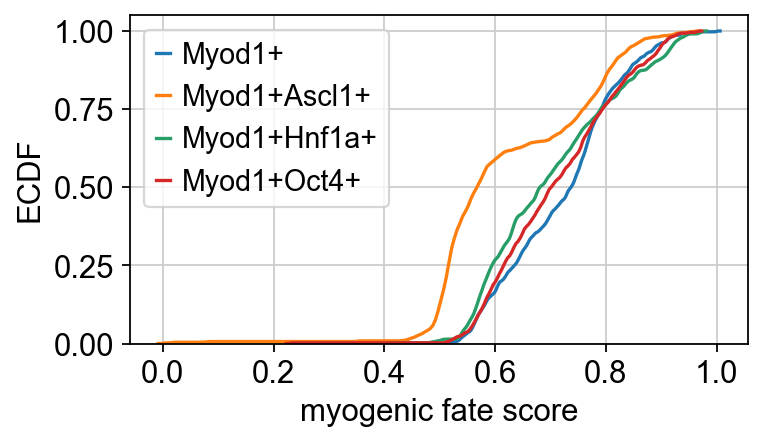

In [51]:
plt_pdf = False
if not plt_pdf:
    fig, axs = plt.subplots(ncols=1,nrows=1, figsize=(5,3))
    axs = [axs]
    cumuls = [True]
else: 
    fig, axs = plt.subplots(ncols=1,nrows=2, figsize=(5,6))
    cumuls = [True, False]
for i, cumul in enumerate(cumuls):
    cluster_selection = [
        'neuronal_1', 
        'neuronal_2',
        'neuronal_3', 
        'neuronal_4',
        'neuronal_myogenic',
        'myogenic_1',
        'myogenic_2',
        'myogenic_3',
    ]
    adata_i = adata_proc[
        [
            x in cluster_selection
            and adata_proc.obs["inferred_category_real"].values[i] == '2) AcGFP1, Myod1'
            for i, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
        ]
    ]
    axs[i] = sb.kdeplot(
        data=adata_i.obs["fate_score_myod1_premature"].values,
        label="Myod1+",
        bw=0.02,
        cumulative=cumul,
        ax=axs[i]
    )
    for j, cond in enumerate([
        ("Ascl1", '5) AcGFP1, DsRed, Ascl1, Myod1'),
        ("Hnf1a", '6) DsRed, EBFP2, Myod1, Hnf1a'),
        ("Oct4", '8) AcGFP1, DsRed, Myod1, Pou5f1')
    ]):
        adata_ij = adata_proc[
            [
                x in cluster_selection
                and adata_proc.obs["inferred_category_real"].values[i] == cond[1]
                for i, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
            ]
        ]
        axs[i] = sb.kdeplot(
            data=adata_ij.obs["fate_score_myod1_premature"].values,
            label="Myod1+"+cond[0]+"+",
            bw=0.02,
            cumulative=cumul,
            ax=axs[i]
        )
        # Compute significance of delay based on one sided KS test:
        print("%s: p=%f" % (cond[0], scipy.stats.ks_2samp(
            data1=adata_i.obs["fate_score_myod1_premature"].values, 
            data2=adata_ij.obs["fate_score_myod1_premature"].values, 
            alternative='less'
        )[1]))
    plt.legend()
    if i == 0:
        axs[i].set_ylabel("ECDF")
    if i == 1:
        axs[i].set_ylabel("PDF")
    axs[i].set_xlabel("myogenic fate score")
plt.tight_layout()
plt.show()

#### Muscle lineage - full

Ascl1: p=0.000000
Hnf1a: p=0.000000
Oct4: p=0.000039


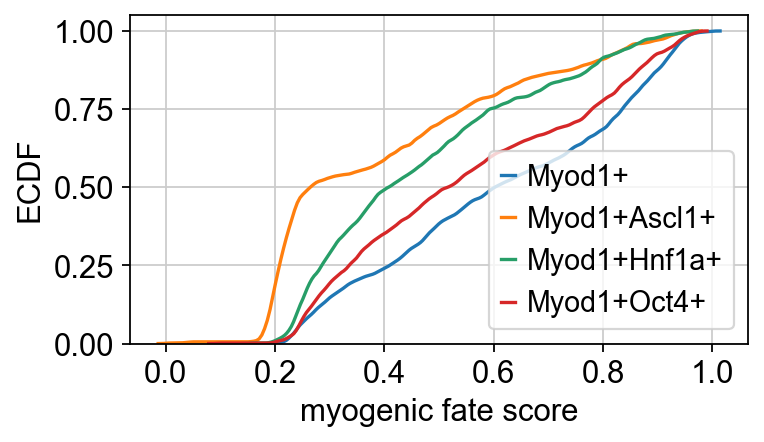

In [52]:
plt_pdf = False
if not plt_pdf:
    fig, axs = plt.subplots(ncols=1,nrows=1, figsize=(5,3))
    axs = [axs]
    cumuls = [True]
else: 
    fig, axs = plt.subplots(ncols=1,nrows=2, figsize=(5,6))
    cumuls = [True, False]
for i, cumul in enumerate(cumuls):
    cluster_selection = [
        'neuronal_1', 
        'neuronal_2',
        'neuronal_3', 
        'neuronal_4',
        'neuronal_myogenic',
        'myogenic_1',
        'myogenic_2',
        'myogenic_3',
    ]
    adata_i = adata_proc[
        [
            x in cluster_selection
            and adata_proc.obs["inferred_category_real"].values[i] == '2) AcGFP1, Myod1'
            for i, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
        ]
    ]
    axs[i] = sb.kdeplot(
        data=adata_i.obs["fate_score_myod1"].values,
        label="Myod1+",
        bw=0.02,
        cumulative=cumul,
        ax=axs[i]
    )
    for j, cond in enumerate([
        ("Ascl1", '5) AcGFP1, DsRed, Ascl1, Myod1'),
        ("Hnf1a", '6) DsRed, EBFP2, Myod1, Hnf1a'),
        ("Oct4", '8) AcGFP1, DsRed, Myod1, Pou5f1')
    ]):
        adata_ij = adata_proc[
            [
                x in cluster_selection
                and adata_proc.obs["inferred_category_real"].values[i] == cond[1]
                for i, x in enumerate(adata_proc.obs["louvain_lineage_coarse"].values)
            ]
        ]
        axs[i] = sb.kdeplot(
            data=adata_ij.obs["fate_score_myod1"].values,
            label="Myod1+"+cond[0]+"+",
            bw=0.02,
            cumulative=cumul,
            ax=axs[i]
        )
        # Compute significance of delay based on one sided KS test:
        print("%s: p=%f" % (cond[0], scipy.stats.ks_2samp(
            data1=adata_i.obs["fate_score_myod1"].values, 
            data2=adata_ij.obs["fate_score_myod1"].values, 
            alternative='less'
        )[1]))
    plt.legend()
    if i == 0:
        axs[i].set_ylabel("ECDF")
    if i == 1:
        axs[i].set_ylabel("PDF")
    axs[i].set_xlabel("myogenic fate score")
plt.tight_layout()
plt.show()

## Show scores on intermediate clusters

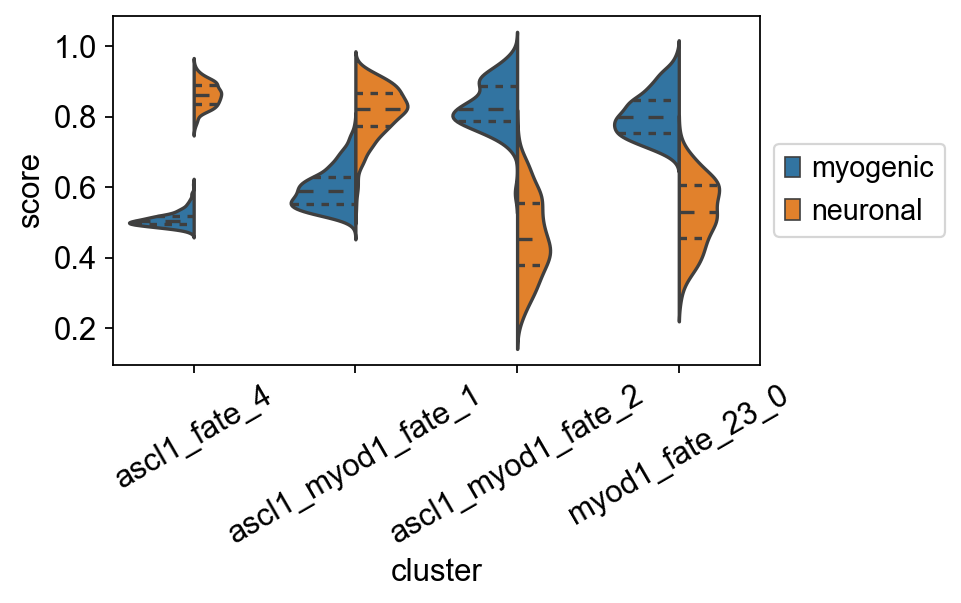

In [53]:
obs_temp = adata_proc.obs.copy()
obs_temp = obs_temp[[  # choose target conditions
    x in [
        "ascl1_fate_4", 
        "ascl1_myod1_fate_1",
        "ascl1_myod1_fate_2",
        "myod1_fate_23_0"
    ]
    for x in obs_temp["louvain_named_subclustered"].values
]]
obs_temp["louvain_named_subclustered"] = pd.Categorical(
    obs_temp["louvain_named_subclustered"].values, 
    categories=[
        "ascl1_fate_4", 
        "ascl1_myod1_fate_1",
        "ascl1_myod1_fate_2",
        "myod1_fate_23_0"
    ]
)
obs_temp = pd.concat([
    pd.DataFrame({
        "cluster": obs_temp["louvain_named_subclustered"].values,
        "score": obs_temp["fate_score_myod1_premature"].values,
        "score_type": "myogenic",
    }),
    pd.DataFrame({
        "cluster": obs_temp["louvain_named_subclustered"].values,
        "score": obs_temp["fate_score_ascl1"].values,
        "score_type": "neuronal",
    })
], axis=0)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
sb.violinplot(
    data=obs_temp,
    x="cluster", y="score", hue="score_type", split=True, inner="quartile"
)
box = axs.get_position()
axs.set_position([box.x0, box.y0, box.width * 0.95, box.height])
axs.legend(loc='center left', bbox_to_anchor=(1, 0.5))
axs.grid(False)
axs.xaxis.set_tick_params(rotation=30)
plt.tight_layout()
plt.savefig(dir_out + "EV3g.pdf")
plt.show()